In [ ]:
from __future__ import print_function, division
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import copy, pickle, os, time
import argparse
import pandas as pd
import os, copy, time, pickle
import torch.nn.functional as F
from torch.autograd import Variable
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
from torchvision.datasets.folder import IMG_EXTENSIONS
from torchvision.datasets import ImageFolder
from sklearn.metrics import confusion_matrix
import glob, pickle
import seaborn as sn
import plotly.graph_objects as go
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import plot_precision_recall_curve
from sklearn.metrics import average_precision_score
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from torch.utils.data import Subset
from matplotlib import pyplot


In [ ]:
!cat /proc/cpuinfo

processor	: 0
vendor_id	: GenuineIntel
cpu family	: 6
model		: 79
model name	: Intel(R) Xeon(R) CPU @ 2.20GHz
stepping	: 0
microcode	: 0x1
cpu MHz		: 2199.998
cache size	: 56320 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_single ssbd ibrs ibpb stibp fsgsbase tsc_adjust bmi1 hle avx2 smep bmi2 erms invpcid rtm rdseed adx smap xsaveopt arat md_clear arch_capabilities
bugs		: cpu_meltdown spectre_v1 spectre_v2 spec_store_bypass l1tf mds swapgs taa
bogomips	: 4399.99
clflush size	: 64
cache_alignment	: 64
address sizes	: 46 bits physical, 48 b

In [ ]:
!nvidia-smi

Thu Jan 28 08:34:17 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   60C    P8    11W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Data Partition: Train-test split in 80:20 ratio

In [ ]:
# For covid +ve class
import os
import numpy as np
import shutil

# # Creating Train / Val / Test folders (One time use)
root_dir = '/content/drive/MyDrive/data'
posCls = '/covid'
negCls = '/non'

os.makedirs(root_dir +'/train' + posCls)
os.makedirs(root_dir +'/train' + negCls)
os.makedirs(root_dir +'/test' + posCls)
os.makedirs(root_dir +'/test' + negCls)

# Creating partitions of the data after shuffeling for covid class
currentCls = posCls
src = "/content/drive/MyDrive/train"+currentCls # Folder to copy images from

allFileNames = os.listdir(src)
np.random.shuffle(allFileNames)
train_FileNames, test_FileNames = np.split(np.array(allFileNames),
                                                          [int(len(allFileNames)*0.8)])


train_FileNames = [src+'/'+ name for name in train_FileNames.tolist()]
test_FileNames = [src+'/' + name for name in test_FileNames.tolist()]

print('Total images: ', len(allFileNames))
print('Training: ', len(train_FileNames))
print('Testing: ', len(test_FileNames))

# Copy-pasting images
for name in train_FileNames:
    shutil.copy(name, "/content/drive/MyDrive/data/train"+currentCls)

for name in test_FileNames:
    shutil.copy(name, "/content/drive/MyDrive/data/test"+currentCls)






In [ ]:
# Creating partitions of the data after shuffeling for non-covid class
currentCls = negCls
src = "/content/drive/MyDrive/train"+currentCls # Folder to copy images from

allFileNames = os.listdir(src)
np.random.shuffle(allFileNames)
train_FileNames, test_FileNames = np.split(np.array(allFileNames),
                                                          [int(len(allFileNames)*0.8)])


train_FileNames = [src+'/'+ name for name in train_FileNames.tolist()]
test_FileNames = [src+'/' + name for name in test_FileNames.tolist()]

print('Total images: ', len(allFileNames))
print('Training: ', len(train_FileNames))
print('Testing: ', len(test_FileNames))

# Copy-pasting images
for name in train_FileNames:
    shutil.copy(name, "/content/drive/MyDrive/data/train"+currentCls)

for name in test_FileNames:
    shutil.copy(name, "/content/drive/MyDrive/data/test"+currentCls)

In [ ]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(224),
        transforms.RandomResizedCrop(224),
        #transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
}

In [ ]:
data_dir = '/content/drive/MyDrive/data'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'test']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=16,
                                             shuffle=True, num_workers=4)
              for x in ['train', 'test']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'test']}
class_names = image_datasets['train'].classes

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
dataset_sizes

{'test': 200, 'train': 800}

In [ ]:
class_names

['covid', 'non']

In [ ]:
def train_model(model, criterion, optimizer, scheduler,batch_szie, num_epochs= 20):
    since = time.time()
    
    
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    train_acc= list()
    valid_acc= list()
    old_val_loss = 100.0
    

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch+1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'test']:
            if phase == 'train':
                scheduler.step()
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_prec= 0.0
            running_rec = 0.0
            running_f1  = 0.0

            # Iterate over data.
            cur_batch_ind= 0
            for inputs, labels in dataloaders[phase]:
                #print(cur_batch_ind,"batch inputs shape:", inputs.shape)
                #print(cur_batch_ind,"batch label shape:", labels.shape)
                inputs = inputs.to(device)
                labels = labels.to(device)
                

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

                cur_acc= torch.sum(preds == labels.data).double()/batch_szie
                cur_batch_ind +=1
                print("\npreds:", preds)
                print("label:", labels.data)
                print("%d-th epoch, %d-th batch (size=%d), %s acc= %.3f \n" %(epoch+1, cur_batch_ind, len(labels), phase, cur_acc ))
                
                if phase=='train':
                    train_acc.append(cur_acc)
                else:
                    valid_acc.append(cur_acc)
                
            epoch_loss= running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            
            if phase=='train':
              train_loss.append(epoch_loss)
              train_accuracy.append(epoch_acc)
            else:
              valid_loss.append(epoch_loss)
              valid_accuracy.append(epoch_acc)
            print('{} Loss: {:.4f} Acc: {:.4f} \n\n'.format(
                phase, epoch_loss, epoch_acc))

          
            # deep copy the model
            if phase == 'test' and epoch_loss < old_val_loss:
                # best_acc = epoch_acc
                old_val_loss = epoch_loss
                best_epoch= epoch
                best_model_wts = copy.deepcopy(model.state_dict())
       

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    # print('Best val Acc= %.3f at Epoch: %d' %(best_acc,best_epoch) )
    print('Best val loss= %.3f at Epoch: %d' %(old_val_loss,best_epoch))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, train_acc, valid_acc


Customized ResNet18

In [ ]:
#### load model
model_conv = torchvision.models.resnet18(pretrained=True)
# for param in model_conv.parameters():
#     param.requires_grad = False

# Parameters of newly constructed modules have requires_grad=True by default   
num_ftrs = model_conv.fc.in_features        
model_conv.fc = nn.Linear(num_ftrs, 2)

model_conv = model_conv.to(device)  
criterion = nn.CrossEntropyLoss()

optimizer_conv = optim.SGD(model_conv.parameters(), lr= 0.001, momentum= 0.9)  

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


In [ ]:
train_loss = list()
valid_loss = list()
train_accuracy = list()
valid_accuracy = list()
model_conv, train_acc, valid_acc = train_model(model_conv, criterion, optimizer_conv,
                         exp_lr_scheduler, batch_szie=16, num_epochs= 50)

Epoch 1/50
----------


/usr/local/lib/python3.6/dist-packages/torch/optim/lr_scheduler.py:136: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



Streaming output truncated to the last 5000 lines.


preds: tensor([0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')
label: tensor([0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')
35-th epoch, 35-th batch (size=16), train acc= 1.000 


preds: tensor([0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')
label: tensor([0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')
35-th epoch, 36-th batch (size=16), train acc= 1.000 


preds: tensor([0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1], device='cuda:0')
label: tensor([0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1], device='cuda:0')
35-th epoch, 37-th batch (size=16), train acc= 1.000 


preds: tensor([1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0], device='cuda:0')
label: tensor([1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0], device='cuda:0')
35-th epoch, 38-th batch (size=16), train acc= 1.000 


preds: tensor([1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0], device='cud

In [ ]:
cd '/content/drive/MyDrive/train_model_final_v3'

/content/drive/MyDrive/train_model_final_v3


In [ ]:
 torch.save(model_conv, './covid3_resnet18')

In [ ]:
epoch = list(range(1,51))

In [ ]:
print(len(train_loss), len(valid_loss),len(train_accuracy), len(valid_accuracy), len(epoch))

50 50 50 50 50


In [ ]:
df_resnet18 = pd.DataFrame(list(zip(epoch, train_loss, valid_loss, train_accuracy, valid_accuracy)), columns = ['epoch', 'train_loss', 'val_loss', 'train_accuracy', 'valid_accuracy'])

In [ ]:
df_resnet18.to_csv("df_resnet18_train_val_loss.csv")

In [ ]:
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=df_resnet18['epoch'], y=df_resnet18['train_loss'],
                    mode='lines+markers',
                    name='train_loss'))
fig.add_trace(go.Scatter(x=df_resnet18['epoch'], y=df_resnet18['val_loss'],
                    mode='lines+markers',
                    name='val_loss'))

fig.update_layout(
    title={
        'text': "Training Loss vs Validation Loss for fine-tuned ResNet18",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()

In [ ]:
model = torch.load('/content/drive/MyDrive/train_model_final_v3/covid3_resnet18')
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
test_covid= glob.glob('/content/drive/MyDrive/val/covid/*')
test_non= glob.glob('/content/drive/MyDrive/val/non/*')

covid_pred= np.zeros([len(test_covid),1]).astype(int)
non_pred  = np.zeros([len(test_non),1]).astype(int)

covid_prob= np.zeros([len(test_covid),1])
non_prob   = np.zeros([len(test_non),1])

In [ ]:
imsize= 224
loader = transforms.Compose([transforms.Resize(imsize), 
                             transforms.CenterCrop(224), 
                             transforms.ToTensor(),
                             transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
                             ])

def image_loader(image_name):
    """load image, returns cuda tensor"""
    image = Image.open(image_name).convert("RGB")
    image = loader(image).float()
    image = Variable(image, requires_grad=True)
    image = image.unsqueeze(0)  #this is for VGG, may not be needed for ResNet
    image = image.to('cuda')
    return image

In [ ]:
sm = torch.nn.Softmax()

In [ ]:
for i in range(len(test_covid)):
    cur_img= image_loader(test_covid[i])
    print(test_covid[i])
    model_output= model(cur_img)
    cur_pred = model_output.max(1, keepdim=True)[1].cpu()
    cur_prob = sm(model_output).cpu()
    covid_prob[i,:]= cur_prob.data.numpy()[0,0]
    print("%03d Covid predicted label:%s" %(i, class_names[int(cur_pred.data.numpy())]) )

/content/drive/MyDrive/val/covid/16669_1_1.jpeg
000 Covid predicted label:covid
/content/drive/MyDrive/val/covid/16654_4_1.jpg
001 Covid predicted label:covid
/content/drive/MyDrive/val/covid/53EC07C9-5CC6-4BE4-9B6F-D7B0D72AAA7E.jpeg
002 Covid predicted label:covid
/content/drive/MyDrive/val/covid/16660_4_1.jpg
003 Covid predicted label:covid
/content/drive/MyDrive/val/covid/1-s2.0-S0929664620300449-gr2_lrg-c.jpg
004 Covid predicted label:covid
/content/drive/MyDrive/val/covid/16660_2_1.jpg
005 Covid predicted label:covid


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



/content/drive/MyDrive/val/covid/16660_1_1.jpg
006 Covid predicted label:covid
/content/drive/MyDrive/val/covid/16674_1_1.jpg
007 Covid predicted label:covid
/content/drive/MyDrive/val/covid/7-fatal-covid19.jpg
008 Covid predicted label:covid
/content/drive/MyDrive/val/covid/16660_3_1.jpg
009 Covid predicted label:covid
/content/drive/MyDrive/val/covid/1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-003-fig4a.png
010 Covid predicted label:covid
/content/drive/MyDrive/val/covid/1-s2.0-S1684118220300682-main.pdf-003-b2.png
011 Covid predicted label:covid
/content/drive/MyDrive/val/covid/A7E260CE-8A00-4C5F-A7F5-27336527A981.jpeg
012 Covid predicted label:covid
/content/drive/MyDrive/val/covid/88de9d8c39e946abd495b37cd07d89e5-6531-0.jpg
013 Covid predicted label:covid
/content/drive/MyDrive/val/covid/03BF7561-A9BA-4C3C-B8A0-D3E585F73F3C.jpeg
014 Covid predicted label:covid
/content/drive/MyDrive/val/covid/16654_1_1.png
015 Covid predicted label:covid
/content/drive/MyDrive/val/covid/ajr.20.

In [ ]:
for i in range(len(test_covid)):
    cur_img= image_loader(test_covid[i])
    model_output= model(cur_img)
    cur_pred = model_output.max(1, keepdim=True)[1].cpu()
    cur_prob = sm(model_output).cpu()
    covid_prob[i,:]= cur_prob.data.numpy()[0,0]
    print("%03d Covid predicted label:%s" %(i, class_names[int(cur_pred.data.numpy())]) )

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



000 Covid predicted label:covid
001 Covid predicted label:covid
002 Covid predicted label:covid
003 Covid predicted label:covid
004 Covid predicted label:covid
005 Covid predicted label:covid
006 Covid predicted label:covid
007 Covid predicted label:covid
008 Covid predicted label:covid
009 Covid predicted label:covid
010 Covid predicted label:covid
011 Covid predicted label:covid
012 Covid predicted label:covid
013 Covid predicted label:covid
014 Covid predicted label:covid
015 Covid predicted label:covid
016 Covid predicted label:covid
017 Covid predicted label:covid
018 Covid predicted label:covid
019 Covid predicted label:covid
020 Covid predicted label:covid
021 Covid predicted label:covid
022 Covid predicted label:covid
023 Covid predicted label:covid
024 Covid predicted label:covid
025 Covid predicted label:covid
026 Covid predicted label:covid
027 Covid predicted label:covid
028 Covid predicted label:covid
029 Covid predicted label:covid
030 Covid predicted label:covid
031 Covi

In [ ]:
for i in range(len(test_non)):
  cur_img= image_loader(test_non[i])
  model_output= model(cur_img)
  cur_pred = model_output.max(1, keepdim=True)[1].cpu()
  cur_prob = sm(model_output).cpu()
  non_prob[i,:]= cur_prob.data.numpy()[0,0]
  print("%03d Non-Covid predicted label:%s" %(i, class_names[int(cur_pred.data.numpy())]) )

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



000 Non-Covid predicted label:non
001 Non-Covid predicted label:non
002 Non-Covid predicted label:non
003 Non-Covid predicted label:non
004 Non-Covid predicted label:non
005 Non-Covid predicted label:non
006 Non-Covid predicted label:non
007 Non-Covid predicted label:non
008 Non-Covid predicted label:non
009 Non-Covid predicted label:non
010 Non-Covid predicted label:non
011 Non-Covid predicted label:non
012 Non-Covid predicted label:non
013 Non-Covid predicted label:non
014 Non-Covid predicted label:non
015 Non-Covid predicted label:non
016 Non-Covid predicted label:non
017 Non-Covid predicted label:non
018 Non-Covid predicted label:non
019 Non-Covid predicted label:non
020 Non-Covid predicted label:non
021 Non-Covid predicted label:non
022 Non-Covid predicted label:non
023 Non-Covid predicted label:non
024 Non-Covid predicted label:non
025 Non-Covid predicted label:non
026 Non-Covid predicted label:non
027 Non-Covid predicted label:non
028 Non-Covid predicted label:non
029 Non-Covid 

In [ ]:
resnet18_covid_prob = covid_prob
resnet18_non_prob = non_prob 

In [ ]:
covid_prob = resnet18_covid_prob
non_prob = resnet18_non_prob

In [ ]:
############### Utility function to find sensitivity and specificity for different cut-off thresholds
def find_sens_spec( covid_prob, noncovid_prob, thresh):
    sensitivity= (covid_prob >= thresh).sum()   / (len(covid_prob)+1e-10)
    specificity= (noncovid_prob < thresh).sum() / (len(noncovid_prob)+1e-10)
    print("sensitivity= %.3f, specificity= %.3f" %(sensitivity,specificity))
    return sensitivity, specificity
    
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
############### find sensitivity and specificity
thresh= 0.2
sensitivity_40, specificity= find_sens_spec(resnet18_covid_prob, resnet18_non_prob, thresh)

sensitivity= 0.980, specificity= 0.975


In [ ]:
############### find sensitivity and specificity
thresh= 0.3
sensitivity_40, specificity= find_sens_spec(resnet18_covid_prob, resnet18_non_prob, thresh)

sensitivity= 0.980, specificity= 0.982


In [ ]:
############### find sensitivity and specificity
thresh= 0.4
sensitivity_40, specificity= find_sens_spec(resnet18_covid_prob, resnet18_non_prob, thresh)

sensitivity= 0.960, specificity= 0.986


In [ ]:
############### find sensitivity and specificity
thresh= 0.5
sensitivity_40, specificity= find_sens_spec(resnet18_covid_prob, resnet18_non_prob, thresh)

sensitivity= 0.950, specificity= 0.990


In [ ]:
############### find sensitivity and specificity
thresh= 0.6
sensitivity_40, specificity= find_sens_spec(resnet18_covid_prob, resnet18_non_prob, thresh)

sensitivity= 0.940, specificity= 0.992


In [ ]:
############### find sensitivity and specificity
thresh= 0.75
sensitivity_40, specificity= find_sens_spec(resnet18_covid_prob, resnet18_non_prob, thresh)

sensitivity= 0.930, specificity= 0.994


In [ ]:

############### derive labels based on probabilities and cut-off threshold
covid_pred = np.where( resnet18_covid_prob  >thresh, 1, 0)
non_pred   = np.where( resnet18_non_prob  >thresh,   1, 0)

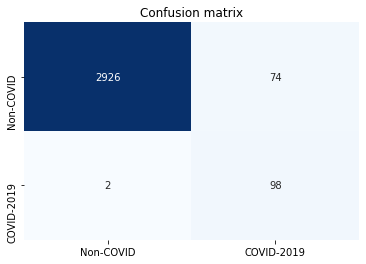

In [ ]:
############### derive confusion-matrix
covid_list= [int(covid_pred[i]) for i in range(len(covid_pred))]
covid_count = [(x, covid_list.count(x)) for x in set(covid_list)]

non_list= [int(non_pred[i]) for i in range(len(non_pred))]
non_count = [(x, non_list.count(x)) for x in set(non_list)]

y_pred_list= covid_list+non_list
y_test_list= [1 for i in range(len(covid_list))]+[0 for i in range(len(non_list))]

y_pred= np.asarray(y_pred_list, dtype=np.int64)
y_test= np.asarray(y_test_list, dtype=np.int64)

cnf_matrix = confusion_matrix(y_test, y_pred)
np.set_printoptions(precision=2)   

# Plot normalized confusion matrix
df_cm = pd.DataFrame(cnf_matrix, index = [i for i in class_names],
                                 columns = [i for i in class_names])


ax = sn.heatmap(df_cm, cmap=plt.cm.Blues, annot=True, cbar=False, fmt='g', xticklabels= ['Non-COVID','COVID-2019'], yticklabels= ['Non-COVID','COVID-2019'])
ax.set_title("Confusion matrix")
plt.savefig('./confusion_matrix_resnet18.png') #dpi = 200

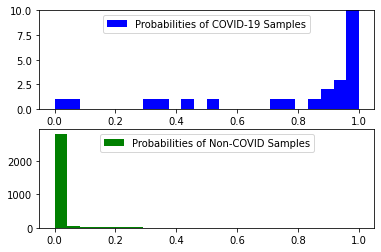

In [ ]:
############### plot the predicted probability distribution
bins = np.linspace(0, 1, 25)
plt.subplot(211)
plt.hist(covid_prob, bins, color= 'blue', histtype = 'bar', label='Probabilities of COVID-19 Samples')
plt.ylim([0,10])
plt.legend(loc='upper center')
plt.subplot(212)
plt.hist(non_prob, bins, color= 'green', label='Probabilities of Non-COVID Samples')
plt.legend(loc='upper center')
plt.savefig('./scores_histogram_resnet18.png') #dpi = 200

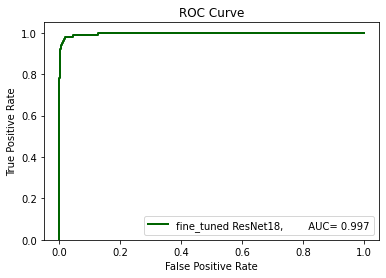

In [ ]:
############### ROC Curve and AUC
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot



y_test_res18= [1 for i in range(len(covid_prob))]+[0 for i in range(len(non_prob))]
y_pred_res18= [covid_prob[i] for i in range(len(covid_prob))]+[non_prob[i] for i in range(len(non_prob))]

           
auc_res18 = roc_auc_score(y_test_res18, y_pred_res18)
ns_fpr_res18, ns_tpr_res18, _ = roc_curve(y_test_res18, y_pred_res18)

plt.figure()
pyplot.plot(ns_fpr_res18, ns_tpr_res18,  color='darkgreen', linewidth=2,   label='fine_tuned ResNet18,        AUC= %.3f' %auc_res18)
pyplot.ylim([0,1.05])
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
pyplot.title("ROC Curve")
# show the legend
pyplot.legend(loc='lower right')
plt.savefig('./ROC_covid19_resnet18.png') #dpi = 200

In [ ]:
# calculate precision-recall curve
precision, recall, thresholds = precision_recall_curve(y_test_res18, y_pred_res18)

In [ ]:

average_precision = average_precision_score(y_test_res18, y_pred_res18)


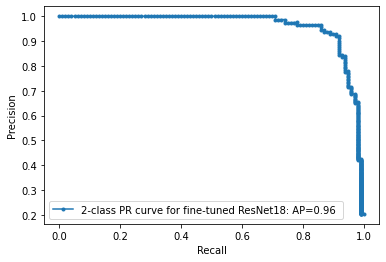

In [ ]:
pyplot.plot(recall, precision, marker='.', label = '2-class PR curve for fine-tuned ResNet18: AP={0:0.2f} '.format(
          average_precision))
# axis labels
pyplot.xlabel('Recall')
pyplot.ylabel('Precision')
# show the legend
pyplot.legend()
# pyplot.title('2-class Precision-Recall curve: AP={0:0.2f}'.format(
#           average_precision)
# show the plot
pyplot.show()

Customized ResNet50

In [ ]:
#### load model
model_conv = torchvision.models.resnet50(pretrained=True)
# for param in model_conv.parameters():
#     param.requires_grad = False

# Parameters of newly constructed modules have requires_grad=True by default   
num_ftrs = model_conv.fc.in_features        
model_conv.fc = nn.Linear(num_ftrs, 2)


model_conv = model_conv.to(device)  
criterion = nn.CrossEntropyLoss()

# Observe that only parameters of final layer are being optimized as
# opoosed to before.
optimizer_conv = optim.SGD(model_conv.parameters(), lr= 0.001, momentum= 0.9)  

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


In [ ]:
train_loss = list()
valid_loss = list()
train_accuracy = list()
valid_accuracy = list()
model_conv, train_acc, valid_acc = train_model(model_conv, criterion, optimizer_conv,
                         exp_lr_scheduler, batch_szie=16, num_epochs= 50)

Epoch 1/50
----------


/usr/local/lib/python3.6/dist-packages/torch/optim/lr_scheduler.py:136: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



Streaming output truncated to the last 5000 lines.


preds: tensor([0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
label: tensor([0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
35-th epoch, 35-th batch (size=16), train acc= 1.000 


preds: tensor([1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
label: tensor([1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
35-th epoch, 36-th batch (size=16), train acc= 0.938 


preds: tensor([1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')
label: tensor([1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')
35-th epoch, 37-th batch (size=16), train acc= 1.000 


preds: tensor([1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')
label: tensor([1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')
35-th epoch, 38-th batch (size=16), train acc= 1.000 


preds: tensor([1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1], device='cud

In [ ]:
pwd

'/content/drive/MyDrive/train_model_final_v3'

In [ ]:
 torch.save(model_conv, './covid3_resnet50')

In [ ]:
df_resnet50 = pd.DataFrame(list(zip(epoch, train_loss, valid_loss, train_accuracy, valid_accuracy)), columns = ['epoch', 'train_loss', 'val_loss', 'train_accuracy', 'valid_accuracy'])

In [ ]:
df_resnet50.to_csv("df_resnet50_train_val_loss.csv")

In [ ]:
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=df_resnet50['epoch'], y=df_resnet50['train_loss'],
                    mode='lines+markers',
                    name='train_loss'))
fig.add_trace(go.Scatter(x=df_resnet50['epoch'], y=df_resnet50['val_loss'],
                    mode='lines+markers',
                    name='val_loss'))

fig.update_layout(
    title={
        'text': "Training Loss vs Validation Loss for fine-tuned ResNet50",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()

In [ ]:
model = torch.load('/content/drive/MyDrive/train_model_final_v3/covid3_resnet50')
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
test_covid= glob.glob('/content/drive/MyDrive/val/covid/*')
test_non= glob.glob('/content/drive/MyDrive/val/non/*')

covid_pred= np.zeros([len(test_covid),1]).astype(int)
non_pred  = np.zeros([len(test_non),1]).astype(int)

covid_prob= np.zeros([len(test_covid),1])
non_prob   = np.zeros([len(test_non),1])


In [ ]:
for i in range(len(test_covid)):
    cur_img= image_loader(test_covid[i])
    model_output= model(cur_img)
    cur_pred = model_output.max(1, keepdim=True)[1].cpu()
    cur_prob = sm(model_output).cpu()
    covid_prob[i,:]= cur_prob.data.numpy()[0,0]
    print("%03d Covid predicted label:%s" %(i, class_names[int(cur_pred.data.numpy())]) )

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



000 Covid predicted label:covid
001 Covid predicted label:covid
002 Covid predicted label:covid
003 Covid predicted label:covid
004 Covid predicted label:covid
005 Covid predicted label:covid
006 Covid predicted label:covid
007 Covid predicted label:covid
008 Covid predicted label:covid
009 Covid predicted label:covid
010 Covid predicted label:covid
011 Covid predicted label:non
012 Covid predicted label:covid
013 Covid predicted label:covid
014 Covid predicted label:covid
015 Covid predicted label:covid
016 Covid predicted label:covid
017 Covid predicted label:covid
018 Covid predicted label:non
019 Covid predicted label:covid
020 Covid predicted label:covid
021 Covid predicted label:covid
022 Covid predicted label:covid
023 Covid predicted label:covid
024 Covid predicted label:covid
025 Covid predicted label:covid
026 Covid predicted label:covid
027 Covid predicted label:covid
028 Covid predicted label:covid
029 Covid predicted label:covid
030 Covid predicted label:covid
031 Covid pr

In [ ]:

for i in range(len(test_non)):
  cur_img= image_loader(test_non[i])
  model_output= model(cur_img)
  cur_pred = model_output.max(1, keepdim=True)[1].cpu()
  cur_prob = sm(model_output).cpu()
  non_prob[i,:]= cur_prob.data.numpy()[0,0]
  print("%03d Non-Covid predicted label:%s" %(i, class_names[int(cur_pred.data.numpy())]) )

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



000 Non-Covid predicted label:non
001 Non-Covid predicted label:non
002 Non-Covid predicted label:non
003 Non-Covid predicted label:non
004 Non-Covid predicted label:non
005 Non-Covid predicted label:non
006 Non-Covid predicted label:non
007 Non-Covid predicted label:covid
008 Non-Covid predicted label:non
009 Non-Covid predicted label:non
010 Non-Covid predicted label:non
011 Non-Covid predicted label:non
012 Non-Covid predicted label:non
013 Non-Covid predicted label:non
014 Non-Covid predicted label:non
015 Non-Covid predicted label:non
016 Non-Covid predicted label:non
017 Non-Covid predicted label:non
018 Non-Covid predicted label:non
019 Non-Covid predicted label:non
020 Non-Covid predicted label:non
021 Non-Covid predicted label:non
022 Non-Covid predicted label:non
023 Non-Covid predicted label:non
024 Non-Covid predicted label:non
025 Non-Covid predicted label:non
026 Non-Covid predicted label:non
027 Non-Covid predicted label:non
028 Non-Covid predicted label:non
029 Non-Covi

In [ ]:
resnet50_covid_prob = covid_prob
resnet50_non_prob = non_prob 

In [ ]:
covid_prob = resnet50_covid_prob
non_prob = resnet50_non_prob

In [ ]:
############### find sensitivity and specificity
thresh= 0.01
sensitivity_40, specificity= find_sens_spec( resnet50_covid_prob, resnet50_non_prob, thresh)

sensitivity= 0.980, specificity= 0.923


In [ ]:
############### find sensitivity and specificity
thresh= 0.3
sensitivity_40, specificity= find_sens_spec( resnet50_covid_prob, resnet50_non_prob, thresh)

sensitivity= 0.970, specificity= 0.992


In [ ]:
############### find sensitivity and specificity
thresh= 0.33
sensitivity_40, specificity= find_sens_spec( resnet50_covid_prob, resnet50_non_prob, thresh)

sensitivity= 0.960, specificity= 0.993


In [ ]:
############### find sensitivity and specificity
thresh= 0.39
sensitivity_40, specificity= find_sens_spec( resnet50_covid_prob, resnet50_non_prob, thresh)

sensitivity= 0.940, specificity= 0.994


In [ ]:
############### find sensitivity and specificity
thresh= 0.45
sensitivity_40, specificity= find_sens_spec( resnet50_covid_prob, resnet50_non_prob, thresh)

sensitivity= 0.930, specificity= 0.994


In [ ]:
############### find sensitivity and specificity
thresh= 0.5
sensitivity_40, specificity= find_sens_spec( resnet50_covid_prob, resnet50_non_prob, thresh)

sensitivity= 0.920, specificity= 0.994


In [ ]:
############### derive labels based on probabilities and cut-off threshold
covid_pred = np.where( resnet50_covid_prob  >thresh, 1, 0)
non_pred   = np.where( resnet50_non_prob  >thresh,   1, 0)


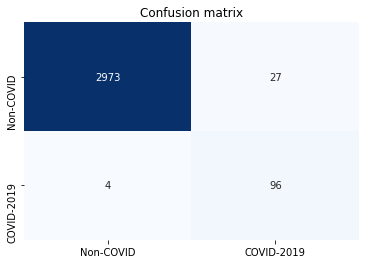

In [ ]:
############### derive confusion-matrix
covid_list= [int(covid_pred[i]) for i in range(len(covid_pred))]
covid_count = [(x, covid_list.count(x)) for x in set(covid_list)]

non_list= [int(non_pred[i]) for i in range(len(non_pred))]
non_count = [(x, non_list.count(x)) for x in set(non_list)]

y_pred_list= covid_list+non_list
y_test_list= [1 for i in range(len(covid_list))]+[0 for i in range(len(non_list))]

y_pred= np.asarray(y_pred_list, dtype=np.int64)
y_test= np.asarray(y_test_list, dtype=np.int64)

cnf_matrix = confusion_matrix(y_test, y_pred)
np.set_printoptions(precision=2)   

# Plot normalized confusion matrix
df_cm = pd.DataFrame(cnf_matrix, index = [i for i in class_names],
                                 columns = [i for i in class_names])


ax = sn.heatmap(df_cm, cmap=plt.cm.Blues, annot=True, cbar=False, fmt='g', xticklabels= ['Non-COVID','COVID-2019'], yticklabels= ['Non-COVID','COVID-2019'])
ax.set_title("Confusion matrix")
plt.savefig('./confusion_matrix_resnet50.png') #dpi = 200

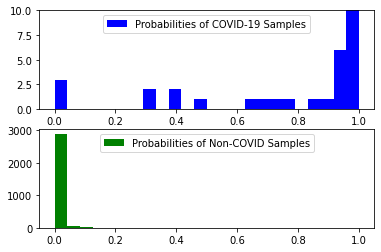

In [ ]:
############### plot the predicted probability distribution
bins = np.linspace(0, 1, 25)
plt.subplot(211)
plt.hist(covid_prob, bins, color= 'blue', histtype = 'bar', label='Probabilities of COVID-19 Samples')
plt.ylim([0,10])
plt.legend(loc='upper center')
plt.subplot(212)
plt.hist(non_prob, bins, color= 'green', label='Probabilities of Non-COVID Samples')
plt.legend(loc='upper center')
plt.savefig('./scores_histogram_resnet50.png') #dpi = 200

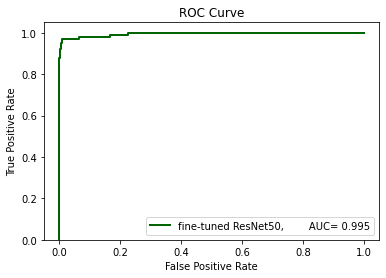

In [ ]:
############### ROC Curve and AUC
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot



y_test_res18= [1 for i in range(len(covid_prob))]+[0 for i in range(len(non_prob))]
y_pred_res18= [covid_prob[i] for i in range(len(covid_prob))]+[non_prob[i] for i in range(len(non_prob))]

           
auc_res18 = roc_auc_score(y_test_res18, y_pred_res18)
ns_fpr_res18, ns_tpr_res18, _ = roc_curve(y_test_res18, y_pred_res18)

plt.figure()
pyplot.plot(ns_fpr_res18, ns_tpr_res18,  color='darkgreen', linewidth=2,   label='fine-tuned ResNet50,        AUC= %.3f' %auc_res18)
pyplot.ylim([0,1.05])
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
pyplot.title("ROC Curve")
# show the legend
pyplot.legend(loc='lower right')
plt.savefig('./ROC_covid19_Resnet50.png') #dpi = 200

In [ ]:
# calculate precision-recall curve
precision, recall, thresholds = precision_recall_curve(y_test_res18, y_pred_res18)

In [ ]:
average_precision = average_precision_score(y_test_res18, y_pred_res18)

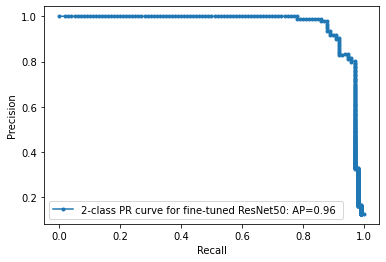

In [ ]:
pyplot.plot(recall, precision, marker='.', label = '2-class PR curve for fine-tuned ResNet50: AP={0:0.2f} '.format(
          average_precision))
# axis labels
pyplot.xlabel('Recall')
pyplot.ylabel('Precision')
# show the legend
pyplot.legend()
# pyplot.title('2-class Precision-Recall curve: AP={0:0.2f}'.format(
#           average_precision)
# show the plot
pyplot.show()

In [ ]:
df_resnet18_covid_prob =  pd.DataFrame(resnet18_covid_prob)

In [ ]:
df_resnet18_covid_prob.to_csv('df_resnet18_covid_prob.csv')

In [ ]:
df_resnet18_non_prob = pd.DataFrame(resnet18_non_prob)

In [ ]:
df_resnet18_non_prob.to_csv('df_resnet18_non_prob.csv')

In [ ]:
df_resnet50_covid_prob =  pd.DataFrame(resnet50_covid_prob)

In [ ]:
df_resnet50_covid_prob.to_csv('df_resnet50_covid_prob.csv')

In [ ]:
df_resnet50_non_prob = pd.DataFrame(resnet50_non_prob)

In [ ]:
df_resnet50_non_prob.to_csv('df_resnet50_non_prob.csv')

In [ ]:
cd '/content/drive/MyDrive/train_model_final_v3'

/content/drive/MyDrive/train_model_final_v3


In [ ]:
import pandas as pd

In [ ]:
df_resnet50_covid_prob = pd.read_csv('df_resnet50_covid_prob.csv')

In [ ]:
covid_prob = df_resnet50_covid_prob['0'].to_list()

In [ ]:
df_resnet50_non_prob = pd.read_csv('df_resnet50_non_prob.csv')

In [ ]:
non_prob = df_resnet50_non_prob['0'].to_list()

In [ ]:
covid_prob

[1.0,
 0.9999997615814208,
 0.9994685053825378,
 0.9999475479125975,
 0.9424933195114136,
 0.9999234676361084,
 0.9999974966049194,
 0.9999614953994752,
 0.9819003343582152,
 0.9997805953025818,
 0.9880751967430116,
 0.3315085470676422,
 0.9632994532585144,
 0.9994934797286988,
 0.9999953508377076,
 0.9999984502792358,
 0.9935392737388612,
 0.9998082518577576,
 0.4608657658100128,
 0.7319912910461426,
 0.9231500029563904,
 0.9997192025184632,
 0.998564064502716,
 1.0,
 0.9999675750732422,
 0.9937180280685424,
 0.9998817443847656,
 0.9022324085235596,
 0.998976469039917,
 0.9999970197677612,
 0.997226893901825,
 0.9868276119232178,
 0.9282134175300598,
 0.9999916553497314,
 0.9636688232421876,
 0.999964714050293,
 0.9997194409370422,
 0.9868260025978088,
 0.984263837337494,
 0.9999079704284668,
 0.9992259740829468,
 0.9999191761016846,
 0.9999988079071044,
 0.9663300514221193,
 0.9231075644493104,
 0.999527096748352,
 0.9999539852142334,
 0.9999824762344359,
 0.9995779395103456,
 0.9535

Customized DenseNet-121

In [ ]:
#### load model
model_conv = torchvision.models.densenet121(pretrained=True)
# for param in model_conv.parameters():
#     param.requires_grad = False

# Parameters of newly constructed modules have requires_grad=True by default   
# num_ftrs = model_conv.fc.in_features        
# model_conv.fc = nn.Linear(num_ftrs, 2)
num_ftrs = model_conv.classifier.in_features
model_conv.classifier = nn.Linear(num_ftrs, 2)


model_conv = model_conv.to(device)  
criterion = nn.CrossEntropyLoss()

# Observe that only parameters of final layer are being optimized as
# opoosed to before.
optimizer_conv = optim.SGD(model_conv.parameters(), lr= 0.001, momentum= 0.9)  

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth


In [ ]:
train_loss = list()
valid_loss = list()
train_accuracy = list()
valid_accuracy = list()
model_conv, train_acc, valid_acc = train_model(model_conv, criterion, optimizer_conv,
                         exp_lr_scheduler, batch_szie=16, num_epochs= 50)

Epoch 1/50
----------


/usr/local/lib/python3.6/dist-packages/torch/optim/lr_scheduler.py:136: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



Streaming output truncated to the last 5000 lines.


preds: tensor([1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
label: tensor([1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
35-th epoch, 35-th batch (size=16), train acc= 1.000 


preds: tensor([1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1], device='cuda:0')
label: tensor([1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1], device='cuda:0')
35-th epoch, 36-th batch (size=16), train acc= 1.000 


preds: tensor([1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')
label: tensor([1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')
35-th epoch, 37-th batch (size=16), train acc= 1.000 


preds: tensor([1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')
label: tensor([1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')
35-th epoch, 38-th batch (size=16), train acc= 1.000 


preds: tensor([1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cud

In [ ]:
torch.save(model_conv, './covid3_densenet121')

In [ ]:
df_densenet121 = pd.DataFrame(list(zip(epoch, train_loss, valid_loss, train_accuracy, valid_accuracy)), columns = ['epoch', 'train_loss', 'val_loss', 'train_accuracy', 'valid_accuracy'])
df_densenet121.to_csv("df_densenet121_train_val_loss.csv")

In [ ]:
 fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=df_densenet121['epoch'], y=df_densenet121['train_loss'],
                    mode='lines+markers',
                    name='train_loss'))
fig.add_trace(go.Scatter(x=df_densenet121['epoch'], y=df_densenet121['val_loss'],
                    mode='lines+markers',
                    name='val_loss'))
fig.update_layout(
    title={
        'text': "Training Loss vs Validation Loss for fine-tuned DenseNet-121",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

In [ ]:
model = torch.load('/content/drive/MyDrive/train_model_final_v3/covid3_densenet121')
model.eval()

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [ ]:
test_covid= glob.glob('/content/drive/MyDrive/val/covid/*')
test_non= glob.glob('/content/drive/MyDrive/val/non/*')

covid_pred= np.zeros([len(test_covid),1]).astype(int)
non_pred  = np.zeros([len(test_non),1]).astype(int)

covid_prob= np.zeros([len(test_covid),1])
non_prob   = np.zeros([len(test_non),1])


imsize= 224
loader = transforms.Compose([transforms.Resize(imsize), 
                             transforms.CenterCrop(224), 
                             transforms.ToTensor(),
                             transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
                             ])

def image_loader(image_name):
    """load image, returns cuda tensor"""
    image = Image.open(image_name).convert("RGB")
    image = loader(image).float()
    image = Variable(image, requires_grad=True)
    image = image.unsqueeze(0)  #this is for VGG, may not be needed for ResNet
    image = image.to('cuda')
    return image

sm = torch.nn.Softmax()

In [ ]:
for i in range(len(test_covid)):
    cur_img= image_loader(test_covid[i])
    print(test_covid[i])
    model_output= model(cur_img)
    cur_pred = model_output.max(1, keepdim=True)[1].cpu()
    cur_prob = sm(model_output).cpu()
    covid_prob[i,:]= cur_prob.data.numpy()[0,0]
    print("%03d Covid predicted label:%s" %(i, class_names[int(cur_pred.data.numpy())]) )

/content/drive/MyDrive/val/covid/16669_1_1.jpeg
000 Covid predicted label:covid
/content/drive/MyDrive/val/covid/16654_4_1.jpg
001 Covid predicted label:covid
/content/drive/MyDrive/val/covid/53EC07C9-5CC6-4BE4-9B6F-D7B0D72AAA7E.jpeg
002 Covid predicted label:covid
/content/drive/MyDrive/val/covid/16660_4_1.jpg
003 Covid predicted label:covid


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



/content/drive/MyDrive/val/covid/1-s2.0-S0929664620300449-gr2_lrg-c.jpg
004 Covid predicted label:covid
/content/drive/MyDrive/val/covid/16660_2_1.jpg
005 Covid predicted label:covid
/content/drive/MyDrive/val/covid/16660_1_1.jpg
006 Covid predicted label:covid
/content/drive/MyDrive/val/covid/16674_1_1.jpg
007 Covid predicted label:covid
/content/drive/MyDrive/val/covid/7-fatal-covid19.jpg
008 Covid predicted label:covid
/content/drive/MyDrive/val/covid/16660_3_1.jpg
009 Covid predicted label:covid
/content/drive/MyDrive/val/covid/1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-003-fig4a.png
010 Covid predicted label:covid
/content/drive/MyDrive/val/covid/1-s2.0-S1684118220300682-main.pdf-003-b2.png
011 Covid predicted label:covid
/content/drive/MyDrive/val/covid/A7E260CE-8A00-4C5F-A7F5-27336527A981.jpeg
012 Covid predicted label:covid
/content/drive/MyDrive/val/covid/88de9d8c39e946abd495b37cd07d89e5-6531-0.jpg
013 Covid predicted label:covid
/content/drive/MyDrive/val/covid/03BF7561-A

In [ ]:
for i in range(len(test_covid)):
    cur_img= image_loader(test_covid[i])
    model_output= model(cur_img)
    cur_pred = model_output.max(1, keepdim=True)[1].cpu()
    cur_prob = sm(model_output).cpu()
    covid_prob[i,:]= cur_prob.data.numpy()[0,0]
    print("%03d Covid predicted label:%s" %(i, class_names[int(cur_pred.data.numpy())]) )

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



000 Covid predicted label:covid
001 Covid predicted label:covid
002 Covid predicted label:covid
003 Covid predicted label:covid
004 Covid predicted label:covid
005 Covid predicted label:covid
006 Covid predicted label:covid
007 Covid predicted label:covid
008 Covid predicted label:covid
009 Covid predicted label:covid
010 Covid predicted label:covid
011 Covid predicted label:covid
012 Covid predicted label:covid
013 Covid predicted label:covid
014 Covid predicted label:covid
015 Covid predicted label:covid
016 Covid predicted label:covid
017 Covid predicted label:covid
018 Covid predicted label:covid
019 Covid predicted label:covid
020 Covid predicted label:covid
021 Covid predicted label:covid
022 Covid predicted label:covid
023 Covid predicted label:covid
024 Covid predicted label:covid
025 Covid predicted label:covid
026 Covid predicted label:covid
027 Covid predicted label:covid
028 Covid predicted label:covid
029 Covid predicted label:covid
030 Covid predicted label:covid
031 Covi

In [ ]:
for i in range(len(test_non)):
  cur_img= image_loader(test_non[i])
  model_output= model(cur_img)
  cur_pred = model_output.max(1, keepdim=True)[1].cpu()
  cur_prob = sm(model_output).cpu()
  non_prob[i,:]= cur_prob.data.numpy()[0,0]
  print("%03d Non-Covid predicted label:%s" %(i, class_names[int(cur_pred.data.numpy())]) )

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



000 Non-Covid predicted label:non
001 Non-Covid predicted label:non
002 Non-Covid predicted label:non
003 Non-Covid predicted label:non
004 Non-Covid predicted label:non
005 Non-Covid predicted label:non
006 Non-Covid predicted label:non
007 Non-Covid predicted label:covid
008 Non-Covid predicted label:non
009 Non-Covid predicted label:non
010 Non-Covid predicted label:non
011 Non-Covid predicted label:non
012 Non-Covid predicted label:non
013 Non-Covid predicted label:non
014 Non-Covid predicted label:non
015 Non-Covid predicted label:non
016 Non-Covid predicted label:non
017 Non-Covid predicted label:non
018 Non-Covid predicted label:non
019 Non-Covid predicted label:non
020 Non-Covid predicted label:non
021 Non-Covid predicted label:non
022 Non-Covid predicted label:non
023 Non-Covid predicted label:non
024 Non-Covid predicted label:non
025 Non-Covid predicted label:non
026 Non-Covid predicted label:non
027 Non-Covid predicted label:non
028 Non-Covid predicted label:non
029 Non-Covi

In [ ]:
densenet121_covid_prob = covid_prob
densenet121_non_prob = non_prob

In [ ]:
covid_prob = densenet121_covid_prob 
non_prob = densenet121_non_prob

In [ ]:
df_densenet121_covid_prob =  pd.DataFrame(densenet121_covid_prob)
df_densenet121_covid_prob.to_csv('df_densenet121_covid_prob.csv')

In [ ]:
df_densenet121_non_prob = pd.DataFrame(densenet121_non_prob)
df_densenet121_non_prob.to_csv('df_densenet121_non_prob.csv')

In [ ]:
############### find sensitivity and specificity
thresh= 0.1
sensitivity_40, specificity= find_sens_spec( densenet121_covid_prob, densenet121_non_prob, thresh)

sensitivity= 0.960, specificity= 0.953


In [ ]:
############### find sensitivity and specificity
thresh= 0.2
sensitivity_40, specificity= find_sens_spec( densenet121_covid_prob, densenet121_non_prob, thresh)

sensitivity= 0.950, specificity= 0.969


In [ ]:
############### find sensitivity and specificity
thresh= 0.3
sensitivity_40, specificity= find_sens_spec( densenet121_covid_prob, densenet121_non_prob, thresh)

sensitivity= 0.940, specificity= 0.978


In [ ]:
############### find sensitivity and specificity
thresh= 0.45
sensitivity_40, specificity= find_sens_spec( densenet121_covid_prob, densenet121_non_prob, thresh)

sensitivity= 0.940, specificity= 0.985


In [ ]:
############### find sensitivity and specificity
thresh= 0.6
sensitivity_40, specificity= find_sens_spec( densenet121_covid_prob, densenet121_non_prob, thresh)

sensitivity= 0.920, specificity= 0.989


In [ ]:
############### derive labels based on probabilities and cut-off threshold
covid_pred = np.where( densenet121_covid_prob  >thresh, 1, 0)
non_pred   = np.where( densenet121_non_prob  >thresh,   1, 0)

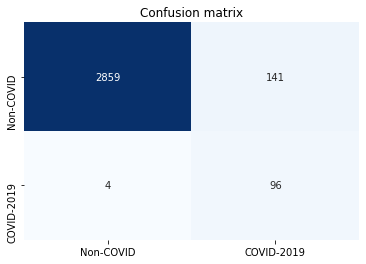

In [ ]:
############### derive confusion-matrix
covid_list= [int(covid_pred[i]) for i in range(len(covid_pred))]
covid_count = [(x, covid_list.count(x)) for x in set(covid_list)]

non_list= [int(non_pred[i]) for i in range(len(non_pred))]
non_count = [(x, non_list.count(x)) for x in set(non_list)]

y_pred_list= covid_list+non_list
y_test_list= [1 for i in range(len(covid_list))]+[0 for i in range(len(non_list))]

y_pred= np.asarray(y_pred_list, dtype=np.int64)
y_test= np.asarray(y_test_list, dtype=np.int64)

cnf_matrix = confusion_matrix(y_test, y_pred)
np.set_printoptions(precision=2)   

# Plot normalized confusion matrix
df_cm = pd.DataFrame(cnf_matrix, index = [i for i in class_names],
                                 columns = [i for i in class_names])


ax = sn.heatmap(df_cm, cmap=plt.cm.Blues, annot=True, cbar=False, fmt='g', xticklabels= ['Non-COVID','COVID-2019'], yticklabels= ['Non-COVID','COVID-2019'])
ax.set_title("Confusion matrix")
plt.savefig('./confusion_matrix_Densenet121.png') #dpi = 200

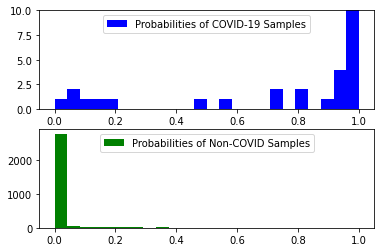

In [ ]:
############### plot the predicted probability distribution
bins = np.linspace(0, 1, 25)
plt.subplot(211)
plt.hist(covid_prob, bins, color= 'blue', histtype = 'bar', label='Probabilities of COVID-19 Samples')
plt.ylim([0,10])
plt.legend(loc='upper center')
plt.subplot(212)
plt.hist(non_prob, bins, color= 'green', label='Probabilities of Non-COVID Samples')
plt.legend(loc='upper center')
plt.savefig('./scores_histogram_DenseNet121.png') #dpi = 200

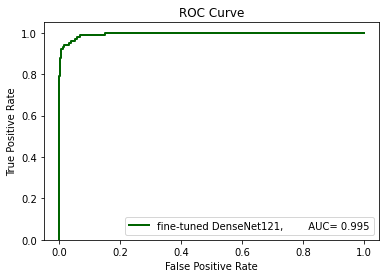

In [ ]:
############### ROC Curve and AUC
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot



y_test_res18= [1 for i in range(len(covid_prob))]+[0 for i in range(len(non_prob))]
y_pred_res18= [covid_prob[i] for i in range(len(covid_prob))]+[non_prob[i] for i in range(len(non_prob))]

           
auc_res18 = roc_auc_score(y_test_res18, y_pred_res18)
ns_fpr_res18, ns_tpr_res18, _ = roc_curve(y_test_res18, y_pred_res18)

plt.figure()
pyplot.plot(ns_fpr_res18, ns_tpr_res18,  color='darkgreen', linewidth=2,   label='fine-tuned DenseNet121,        AUC= %.3f' %auc_res18)
pyplot.ylim([0,1.05])
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
pyplot.title("ROC Curve")
# show the legend
pyplot.legend(loc='lower right')
plt.savefig('./ROC_covid19_DenseNet121.png') #dpi = 200

In [ ]:
# calculate precision-recall curve
precision, recall, thresholds = precision_recall_curve(y_test_res18, y_pred_res18)

In [ ]:

average_precision = average_precision_score(y_test_res18, y_pred_res18)


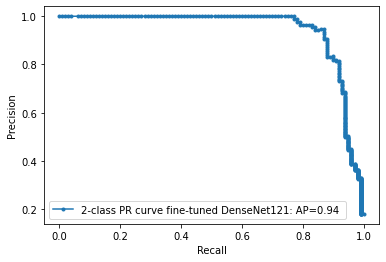

In [ ]:
pyplot.plot(recall, precision, marker='.', label = '2-class PR curve fine-tuned DenseNet121: AP={0:0.2f} '.format(
          average_precision))
# axis labels
pyplot.xlabel('Recall')
pyplot.ylabel('Precision')
# show the legend
pyplot.legend()
# pyplot.title('2-class Precision-Recall curve: AP={0:0.2f}'.format(
#           average_precision)
# show the plot
pyplot.show()

Customized DenseNet-201

In [ ]:
#### load model
model_conv = torchvision.models.densenet201(pretrained=True)
# for param in model_conv.parameters():
#     param.requires_grad = False

# Parameters of newly constructed modules have requires_grad=True by default   
# num_ftrs = model_conv.fc.in_features        
# model_conv.fc = nn.Linear(num_ftrs, 2)
num_ftrs = model_conv.classifier.in_features
model_conv.classifier = nn.Linear(num_ftrs, 2)


model_conv = model_conv.to(device)  
criterion = nn.CrossEntropyLoss()

# Observe that only parameters of final layer are being optimized as
# opoosed to before.
optimizer_conv = optim.SGD(model_conv.parameters(), lr= 0.001, momentum= 0.9)  

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)

Downloading: "https://download.pytorch.org/models/densenet201-c1103571.pth" to /root/.cache/torch/hub/checkpoints/densenet201-c1103571.pth


In [ ]:
train_loss = list()
valid_loss = list()
train_accuracy = list()
valid_accuracy = list()
model_conv, train_acc, valid_acc = train_model(model_conv, criterion, optimizer_conv,
                         exp_lr_scheduler, batch_szie=16, num_epochs= 50)

Epoch 1/50
----------


/usr/local/lib/python3.6/dist-packages/torch/optim/lr_scheduler.py:136: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



Streaming output truncated to the last 5000 lines.


preds: tensor([0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
label: tensor([0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
35-th epoch, 35-th batch (size=16), train acc= 1.000 


preds: tensor([1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')
label: tensor([1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')
35-th epoch, 36-th batch (size=16), train acc= 1.000 


preds: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')
label: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')
35-th epoch, 37-th batch (size=16), train acc= 1.000 


preds: tensor([1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')
label: tensor([1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')
35-th epoch, 38-th batch (size=16), train acc= 1.000 


preds: tensor([1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1], device='cud

In [ ]:
torch.save(model_conv, './covid3_densenet201')

In [ ]:
model = torch.load('/content/drive/MyDrive/train_model_final_v3/covid3_densenet201')
model.eval()

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [ ]:
df_densenet201 = pd.DataFrame(list(zip(epoch, train_loss, valid_loss, train_accuracy, valid_accuracy)), columns = ['epoch', 'train_loss', 'val_loss', 'train_accuracy', 'valid_accuracy'])
df_densenet201.to_csv("df_densenet201_train_val_loss.csv")

In [ ]:
 fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=df_densenet201['epoch'], y=df_densenet201['train_loss'],
                    mode='lines+markers',
                    name='train_loss'))
fig.add_trace(go.Scatter(x=df_densenet201['epoch'], y=df_densenet201['val_loss'],
                    mode='lines+markers',
                    name='val_loss'))
fig.update_layout(
    title={
        'text': "Training Loss vs Validation Loss for fine-tuned DenseNet-201",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

In [ ]:
test_covid= glob.glob('/content/drive/MyDrive/val/covid/*')
test_non= glob.glob('/content/drive/MyDrive/val/non/*')

covid_pred= np.zeros([len(test_covid),1]).astype(int)
non_pred  = np.zeros([len(test_non),1]).astype(int)

covid_prob= np.zeros([len(test_covid),1])
non_prob   = np.zeros([len(test_non),1])

In [ ]:
imsize= 224
loader = transforms.Compose([transforms.Resize(imsize), 
                             transforms.CenterCrop(224), 
                             transforms.ToTensor(),
                             transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
                             ])

def image_loader(image_name):
    """load image, returns cuda tensor"""
    image = Image.open(image_name).convert("RGB")
    image = loader(image).float()
    image = Variable(image, requires_grad=True)
    image = image.unsqueeze(0)  #this is for VGG, may not be needed for ResNet
    image = image.to('cuda')
    return image

sm = torch.nn.Softmax()

In [ ]:
for i in range(len(test_covid)):
    cur_img= image_loader(test_covid[i])
    model_output= model(cur_img)
    cur_pred = model_output.max(1, keepdim=True)[1].cpu()
    cur_prob = sm(model_output).cpu()
    covid_prob[i,:]= cur_prob.data.numpy()[0,0]
    print("%03d Covid predicted label:%s" %(i, class_names[int(cur_pred.data.numpy())]) )

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



000 Covid predicted label:covid
001 Covid predicted label:covid
002 Covid predicted label:covid
003 Covid predicted label:covid
004 Covid predicted label:covid
005 Covid predicted label:covid
006 Covid predicted label:covid
007 Covid predicted label:covid
008 Covid predicted label:covid
009 Covid predicted label:covid
010 Covid predicted label:covid
011 Covid predicted label:covid
012 Covid predicted label:covid
013 Covid predicted label:covid
014 Covid predicted label:covid
015 Covid predicted label:covid
016 Covid predicted label:covid
017 Covid predicted label:covid
018 Covid predicted label:covid
019 Covid predicted label:covid
020 Covid predicted label:covid
021 Covid predicted label:covid
022 Covid predicted label:covid
023 Covid predicted label:covid
024 Covid predicted label:covid
025 Covid predicted label:covid
026 Covid predicted label:covid
027 Covid predicted label:covid
028 Covid predicted label:covid
029 Covid predicted label:covid
030 Covid predicted label:covid
031 Covi

In [ ]:
for i in range(len(test_non)):
  cur_img= image_loader(test_non[i])
  model_output= model(cur_img)
  cur_pred = model_output.max(1, keepdim=True)[1].cpu()
  cur_prob = sm(model_output).cpu()
  non_prob[i,:]= cur_prob.data.numpy()[0,0]
  print("%03d Non-Covid predicted label:%s" %(i, class_names[int(cur_pred.data.numpy())]) )

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



000 Non-Covid predicted label:non
001 Non-Covid predicted label:non
002 Non-Covid predicted label:non
003 Non-Covid predicted label:non
004 Non-Covid predicted label:non
005 Non-Covid predicted label:non
006 Non-Covid predicted label:non
007 Non-Covid predicted label:covid
008 Non-Covid predicted label:non
009 Non-Covid predicted label:non
010 Non-Covid predicted label:non
011 Non-Covid predicted label:non
012 Non-Covid predicted label:non
013 Non-Covid predicted label:non
014 Non-Covid predicted label:non
015 Non-Covid predicted label:non
016 Non-Covid predicted label:non
017 Non-Covid predicted label:non
018 Non-Covid predicted label:non
019 Non-Covid predicted label:non
020 Non-Covid predicted label:non
021 Non-Covid predicted label:non
022 Non-Covid predicted label:non
023 Non-Covid predicted label:non
024 Non-Covid predicted label:non
025 Non-Covid predicted label:non
026 Non-Covid predicted label:non
027 Non-Covid predicted label:non
028 Non-Covid predicted label:non
029 Non-Covi

In [ ]:
densenet201_covid_prod = covid_prob
densenet201_non_prob = non_prob

In [ ]:
covid_prob = densenet201_covid_prod
non_prob = densenet201_non_prob

In [ ]:
df_densenet201_covid_prob =  pd.DataFrame(densenet201_covid_prod)
df_densenet201_covid_prob.to_csv('df_densenet201_covid_prob.csv')
df_densenet201_non_prob = pd.DataFrame(densenet201_non_prob)
df_densenet201_non_prob.to_csv('df_densenet201_non_prob.csv')

In [ ]:
############### find sensitivity and specificity
thresh= 0.05
sensitivity_40, specificity= find_sens_spec( densenet201_covid_prod, densenet201_non_prob, thresh)

sensitivity= 0.980, specificity= 0.966


In [ ]:
############### find sensitivity and specificity
thresh= 0.1
sensitivity_40, specificity= find_sens_spec( densenet201_covid_prod, densenet201_non_prob, thresh)

sensitivity= 0.980, specificity= 0.978


In [ ]:
############### find sensitivity and specificity
thresh= 0.2
sensitivity_40, specificity= find_sens_spec( densenet201_covid_prod, densenet201_non_prob, thresh)

sensitivity= 0.960, specificity= 0.986


In [ ]:
############### find sensitivity and specificity
thresh= 0.3
sensitivity_40, specificity= find_sens_spec( densenet201_covid_prod, densenet201_non_prob, thresh)

sensitivity= 0.960, specificity= 0.991


In [ ]:
############### find sensitivity and specificity
thresh= 0.4
sensitivity_40, specificity= find_sens_spec( densenet201_covid_prod, densenet201_non_prob, thresh)

sensitivity= 0.950, specificity= 0.994


In [ ]:
############### find sensitivity and specificity
thresh= 0.5
sensitivity_40, specificity= find_sens_spec( densenet201_covid_prod, densenet201_non_prob, thresh)

sensitivity= 0.950, specificity= 0.995


In [ ]:
############### find sensitivity and specificity
thresh= 0.7
sensitivity_40, specificity= find_sens_spec( densenet201_covid_prod, densenet201_non_prob, thresh)

sensitivity= 0.940, specificity= 0.997


In [ ]:
############### find sensitivity and specificity
thresh= 0.8
sensitivity_40, specificity= find_sens_spec( densenet201_covid_prod, densenet201_non_prob, thresh)

sensitivity= 0.920, specificity= 0.999


In [ ]:
0############### derive labels based on probabilities and cut-off threshold
covid_pred = np.where( densenet201_covid_prod  >thresh, 1, 0)
non_pred   = np.where( densenet201_non_prob  >thresh,   1, 0)


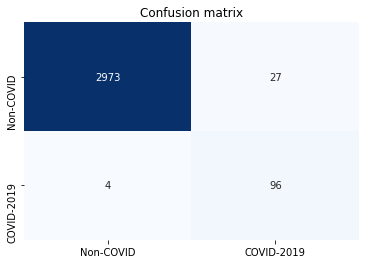

In [ ]:
############### derive confusion-matrix
covid_list= [int(covid_pred[i]) for i in range(len(covid_pred))]
covid_count = [(x, covid_list.count(x)) for x in set(covid_list)]

non_list= [int(non_pred[i]) for i in range(len(non_pred))]
non_count = [(x, non_list.count(x)) for x in set(non_list)]

y_pred_list= covid_list+non_list
y_test_list= [1 for i in range(len(covid_list))]+[0 for i in range(len(non_list))]

y_pred= np.asarray(y_pred_list, dtype=np.int64)
y_test= np.asarray(y_test_list, dtype=np.int64)

cnf_matrix = confusion_matrix(y_test, y_pred)
np.set_printoptions(precision=2)   

# Plot normalized confusion matrix
df_cm = pd.DataFrame(cnf_matrix, index = [i for i in class_names],
                                 columns = [i for i in class_names])


ax = sn.heatmap(df_cm, cmap=plt.cm.Blues, annot=True, cbar=False, fmt='g', xticklabels= ['Non-COVID','COVID-2019'], yticklabels= ['Non-COVID','COVID-2019'])
ax.set_title("Confusion matrix")
plt.savefig('./confusion_matrix_DenseNet201.png') #dpi = 200

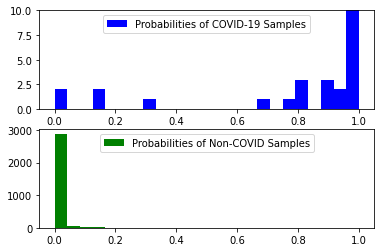

In [ ]:
############### plot the predicted probability distribution
bins = np.linspace(0, 1, 25)
plt.subplot(211)
plt.hist(covid_prob, bins, color= 'blue', histtype = 'bar', label='Probabilities of COVID-19 Samples')
plt.ylim([0,10])
plt.legend(loc='upper center')
plt.subplot(212)
plt.hist(non_prob, bins, color= 'green', label='Probabilities of Non-COVID Samples')
plt.legend(loc='upper center')
plt.savefig('./scores_histogram_Densenet201.png') #dpi = 200

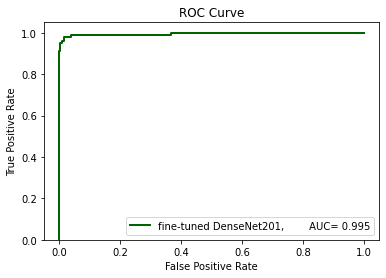

In [ ]:
############### ROC Curve and AUC
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot



y_test_res18= [1 for i in range(len(covid_prob))]+[0 for i in range(len(non_prob))]
y_pred_res18= [covid_prob[i] for i in range(len(covid_prob))]+[non_prob[i] for i in range(len(non_prob))]

           
auc_res18 = roc_auc_score(y_test_res18, y_pred_res18)
ns_fpr_res18, ns_tpr_res18, _ = roc_curve(y_test_res18, y_pred_res18)

plt.figure()
pyplot.plot(ns_fpr_res18, ns_tpr_res18,  color='darkgreen', linewidth=2,   label='fine-tuned DenseNet201,        AUC= %.3f' %auc_res18)
pyplot.ylim([0,1.05])
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
pyplot.title("ROC Curve")
# show the legend
pyplot.legend(loc='lower right')
plt.savefig('./ROC_covid19_DenseNet201.png') #dpi = 200

In [ ]:
# calculate precision-recall curve
precision, recall, thresholds = precision_recall_curve(y_test_res18, y_pred_res18)

In [ ]:
average_precision = average_precision_score(y_test_res18, y_pred_res18)

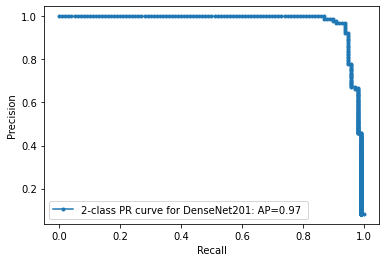

In [ ]:
pyplot.plot(recall, precision, marker='.', label = '2-class PR curve for DenseNet201: AP={0:0.2f} '.format(
          average_precision))
# axis labels
pyplot.xlabel('Recall')
pyplot.ylabel('Precision')
# show the legend
pyplot.legend()
# pyplot.title('2-class Precision-Recall curve: AP={0:0.2f}'.format(
#           average_precision)
# show the plot
pyplot.show()

GradCam Implementation

In [ ]:
cd '/content/drive/MyDrive'

/content/drive/MyDrive


In [ ]:
import os
import PIL
import numpy as np
import torch
import torch.nn.functional as F
import torchvision.models as models
from torchvision import transforms
from torchvision.utils import make_grid, save_image

from gradcam.utils import visualize_cam
from gradcam import GradCAM, GradCAMpp

device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [ ]:
model_resnet18 = torch.load('/content/drive/MyDrive/train_model_final_v3/covid3_resnet18')

In [ ]:
model_resnet50 = torch.load('/content/drive/MyDrive/train_model_final_v3/covid3_resnet50')

In [ ]:
model_densenet121 = torch.load('/content/drive/MyDrive/train_model_final_v3/covid3_densenet121')

In [ ]:
model_densenet201 = torch.load('/content/drive/MyDrive/train_model_final_v3/covid3_densenet201')

In [ ]:
model_resnet18.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
covid_img_path = '/content/drive/MyDrive/val/covid/16654_2_1.jpg'

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(covid_img_path)
model_output= model_resnet18(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[9.9984e-01, 1.6194e-04]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.999838

In [ ]:
covid_pil_img = PIL.Image.open(covid_img_path).convert('RGB')

In [ ]:
covid_torch_img = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])(covid_pil_img).to(device)

In [ ]:
covid_normed_torch_img = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(covid_torch_img)[None]

In [ ]:
configs = [
    dict(model_type='resnet', arch=model_resnet18, layer_name='layer4')]

In [ ]:
for config in configs:
    config['arch'].to(device).eval()

cams = [
    [cls.from_config(**config) for cls in (GradCAM, GradCAMpp)]
    for config in configs
]

In [ ]:
images = []
for gradcam, gradcam_pp in cams:
    mask, logit = gradcam(covid_normed_torch_img, class_idx=0)
    heatmap, result = visualize_cam(mask, covid_torch_img)

    mask_pp, logit2 = gradcam_pp(covid_normed_torch_img, class_idx=0)
    heatmap_pp, result_pp = visualize_cam(mask_pp, covid_torch_img)
    
    images.extend([covid_torch_img.cpu(), heatmap, result])
    
grid_image = make_grid(images, nrow=1)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning:

nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.



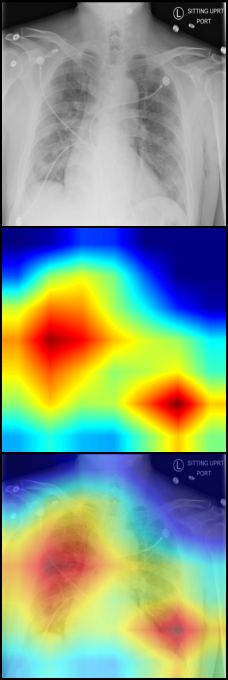

In [ ]:
# Covid image for class idx 0
transforms.ToPILImage()(grid_image)

In [ ]:
images = []
for gradcam, gradcam_pp in cams:
    mask, logit = gradcam(covid_normed_torch_img, class_idx=1)
    heatmap, result = visualize_cam(mask, covid_torch_img)

    mask_pp, logit2 = gradcam_pp(covid_normed_torch_img, class_idx=1)
    heatmap_pp, result_pp = visualize_cam(mask_pp, covid_torch_img)
    
    images.extend([covid_torch_img.cpu(), heatmap, heatmap_pp, result, result_pp])
    
grid_image = make_grid(images, nrow=5)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning:

nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.



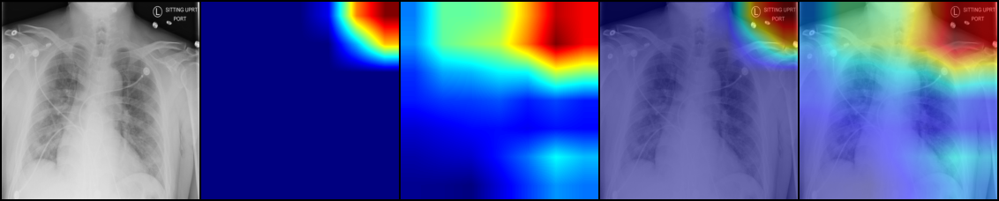

In [ ]:
# Covid image for class idx 1
transforms.ToPILImage()(grid_image)

In [ ]:
images = []
for gradcam, gradcam_pp in cams:
    mask, logit = gradcam(non_covid_normed_torch_img, class_idx=0)
    heatmap, result = visualize_cam(mask, non_covid_torch_img)

    mask_pp, logit2 = gradcam_pp(non_covid_normed_torch_img, class_idx=0)
    heatmap_pp, result_pp = visualize_cam(mask_pp, non_covid_torch_img)
    
    images.extend([non_covid_torch_img.cpu(), heatmap, heatmap_pp, result, result_pp])
    
grid_image = make_grid(images, nrow=5)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning:

nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.



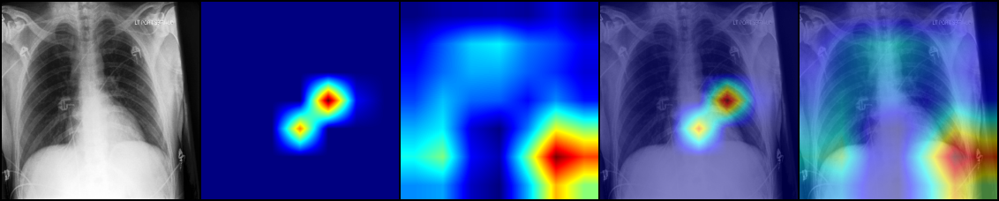

In [ ]:
# Non Covid image for class idx 0
transforms.ToPILImage()(grid_image)

In [ ]:
images = []
for gradcam, gradcam_pp in cams:
    mask, logit = gradcam(non_covid_normed_torch_img, class_idx=1)
    heatmap, result = visualize_cam(mask, non_covid_torch_img)

    mask_pp, logit2 = gradcam_pp(non_covid_normed_torch_img, class_idx=1)
    heatmap_pp, result_pp = visualize_cam(mask_pp, non_covid_torch_img)
    
    images.extend([non_covid_torch_img.cpu(), heatmap, heatmap_pp, result, result_pp])
    
grid_image = make_grid(images, nrow=5)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning:

nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.



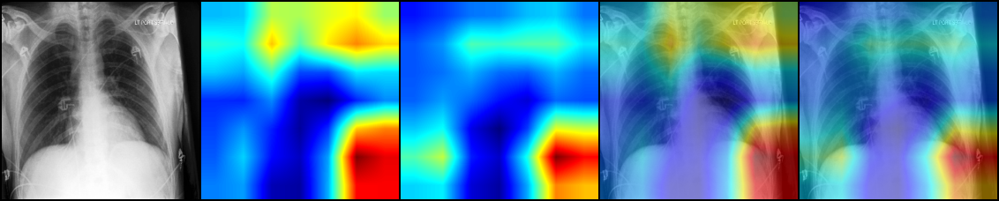

In [ ]:
# Non Covid image for class idx 1
transforms.ToPILImage()(grid_image)

ResNet50

In [ ]:
model_resnet50.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(covid_img_path)
model_output= model_resnet50(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[9.9921e-01, 7.9237e-04]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.9992077

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(non_covid_img_path)
model_output= model_resnet50(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[0.0033, 0.9967]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.0033452814

In [ ]:
covid_pil_img = PIL.Image.open(covid_img_path).convert('RGB')

In [ ]:
covid_pil_img = PIL.Image.open(covid_img_path).convert('RGB')
non_covid_pil_img = PIL.Image.open(non_covid_img_path).convert('RGB')

In [ ]:
covid_torch_img = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])(covid_pil_img).to(device)

non_covid_torch_img = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])(non_covid_pil_img).to(device)


In [ ]:
covid_normed_torch_img = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(covid_torch_img)[None]
non_covid_normed_torch_img = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(non_covid_torch_img)[None]

In [ ]:
configs = [
    dict(model_type='resnet', arch=model_resnet50, layer_name='layer4')]

In [ ]:
for config in configs:
    config['arch'].to(device).eval()

cams = [
    [cls.from_config(**config) for cls in (GradCAM, GradCAMpp)]
    for config in configs
]

In [ ]:
images = []
for gradcam, gradcam_pp in cams:
    mask, logit = gradcam(covid_normed_torch_img, class_idx=0)
    heatmap, result = visualize_cam(mask, covid_torch_img)

    mask_pp, logit2 = gradcam_pp(covid_normed_torch_img, class_idx=0)
    heatmap_pp, result_pp = visualize_cam(mask_pp, covid_torch_img)
    
    images.extend([covid_torch_img.cpu(), heatmap, heatmap_pp, result, result_pp])
    
grid_image = make_grid(images, nrow=5)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning:

nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.



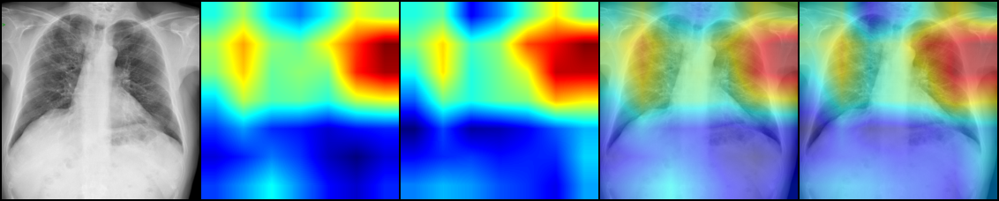

In [ ]:
# Covid image for class idx 0
transforms.ToPILImage()(grid_image)

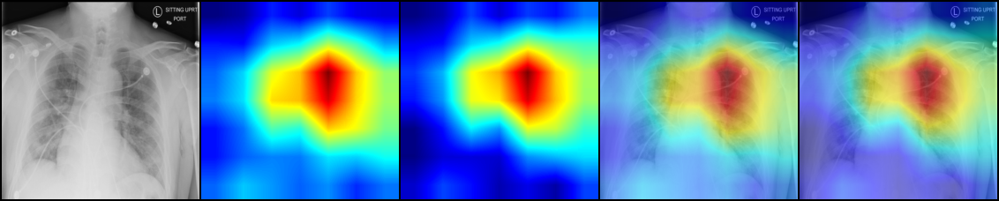

In [ ]:
# Covid image for class idx 0
transforms.ToPILImage()(grid_image)

In [ ]:
images = []
for gradcam, gradcam_pp in cams:
    mask, logit = gradcam(covid_normed_torch_img, class_idx=1)
    heatmap, result = visualize_cam(mask, covid_torch_img)

    mask_pp, logit2 = gradcam_pp(covid_normed_torch_img, class_idx=1)
    heatmap_pp, result_pp = visualize_cam(mask_pp, covid_torch_img)
    
    images.extend([covid_torch_img.cpu(), heatmap, heatmap_pp, result, result_pp])
    
grid_image = make_grid(images, nrow=5)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning:

nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.



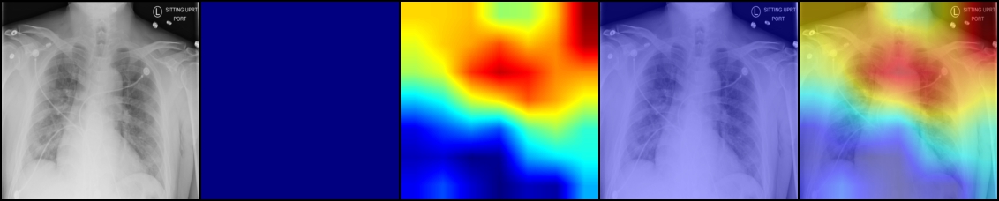

In [ ]:
# Covid image for class idx 1
transforms.ToPILImage()(grid_image)

In [ ]:
images = []
for gradcam, gradcam_pp in cams:
    mask, logit = gradcam(non_covid_normed_torch_img, class_idx=0)
    heatmap, result = visualize_cam(mask, non_covid_torch_img)

    mask_pp, logit2 = gradcam_pp(non_covid_normed_torch_img, class_idx=0)
    heatmap_pp, result_pp = visualize_cam(mask_pp, non_covid_torch_img)
    
    images.extend([non_covid_torch_img.cpu(), heatmap, heatmap_pp, result, result_pp])
    
grid_image = make_grid(images, nrow=5)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning:

nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.



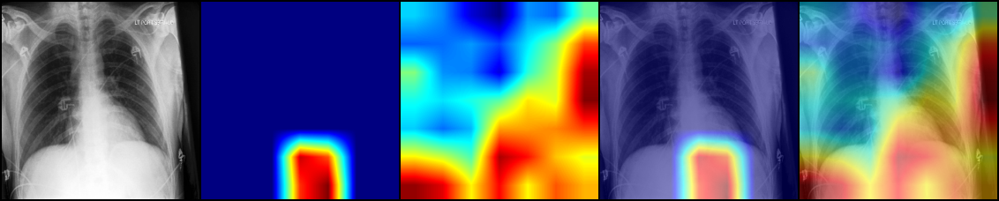

In [ ]:
# Non Covid image for class idx 0
transforms.ToPILImage()(grid_image)

In [ ]:
images = []
for gradcam, gradcam_pp in cams:
    mask, logit = gradcam(non_covid_normed_torch_img, class_idx=1)
    heatmap, result = visualize_cam(mask, non_covid_torch_img)

    mask_pp, logit2 = gradcam_pp(non_covid_normed_torch_img, class_idx=1)
    heatmap_pp, result_pp = visualize_cam(mask_pp, non_covid_torch_img)
    
    images.extend([non_covid_torch_img.cpu(), heatmap, heatmap_pp, result, result_pp])
    
grid_image = make_grid(images, nrow=5)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning:

nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.



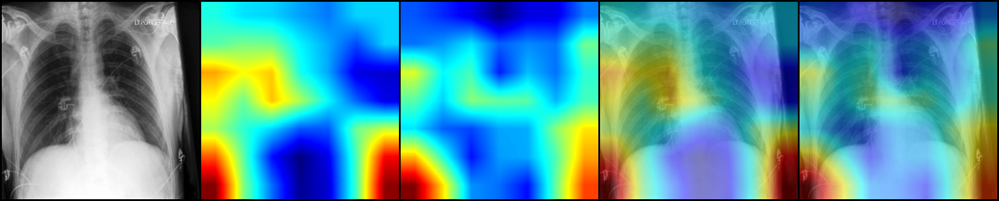

In [ ]:
# Non Covid image for class idx 1
transforms.ToPILImage()(grid_image)

DenseNet121


In [ ]:
model_densenet121.eval()

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(covid_img_path)
model_output= model_densenet121(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[9.9971e-01, 2.8539e-04]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.99971455

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(non_covid_img_path)
model_output= model_densenet121(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[0.1115, 0.8885]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.111490935

In [ ]:
covid_pil_img = PIL.Image.open(covid_img_path).convert('RGB')
non_covid_pil_img = PIL.Image.open(non_covid_img_path).convert('RGB')

In [ ]:
covid_torch_img = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])(covid_pil_img).to(device)

non_covid_torch_img = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])(non_covid_pil_img).to(device)


In [ ]:
covid_normed_torch_img = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(covid_torch_img)[None]
non_covid_normed_torch_img = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(non_covid_torch_img)[None]

In [ ]:
configs = [
    dict(model_type='densenet', arch=model_densenet121, layer_name='features_norm5')
]

In [ ]:
for config in configs:
    config['arch'].to(device).eval()

cams = [
    [cls.from_config(**config) for cls in (GradCAM, GradCAMpp)]
    for config in configs
]

In [ ]:
images = []
for gradcam, gradcam_pp in cams:
    mask, logit = gradcam(covid_normed_torch_img, class_idx=0)
    heatmap, result = visualize_cam(mask, covid_torch_img)

    mask_pp, logit2 = gradcam_pp(covid_normed_torch_img, class_idx=0)
    heatmap_pp, result_pp = visualize_cam(mask_pp, covid_torch_img)
    
    images.extend([covid_torch_img.cpu(), heatmap, heatmap_pp, result, result_pp])
    
grid_image = make_grid(images, nrow=5)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning:

nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.



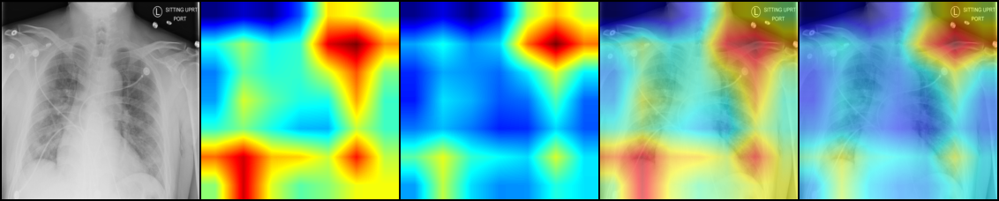

In [ ]:
# Covid image for class idx 0
transforms.ToPILImage()(grid_image)

In [ ]:
images = []
for gradcam, gradcam_pp in cams:
    mask, logit = gradcam(covid_normed_torch_img, class_idx=1)
    heatmap, result = visualize_cam(mask, covid_torch_img)

    mask_pp, logit2 = gradcam_pp(covid_normed_torch_img, class_idx=1)
    heatmap_pp, result_pp = visualize_cam(mask_pp, covid_torch_img)
    
    images.extend([covid_torch_img.cpu(), heatmap, heatmap_pp, result, result_pp])
    
grid_image = make_grid(images, nrow=5)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning:

nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.



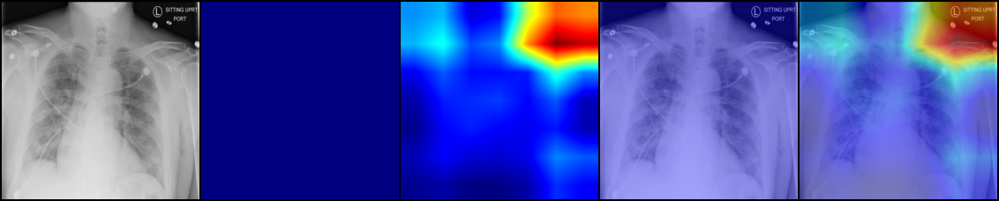

In [ ]:
# Covid image for class idx 1
transforms.ToPILImage()(grid_image)

In [ ]:
images = []
for gradcam, gradcam_pp in cams:
    mask, logit = gradcam(non_covid_normed_torch_img, class_idx=0)
    heatmap, result = visualize_cam(mask, non_covid_torch_img)

    mask_pp, logit2 = gradcam_pp(non_covid_normed_torch_img, class_idx=0)
    heatmap_pp, result_pp = visualize_cam(mask_pp, non_covid_torch_img)
    
    images.extend([non_covid_torch_img.cpu(), heatmap, heatmap_pp, result, result_pp])
    
grid_image = make_grid(images, nrow=5)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning:

nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.



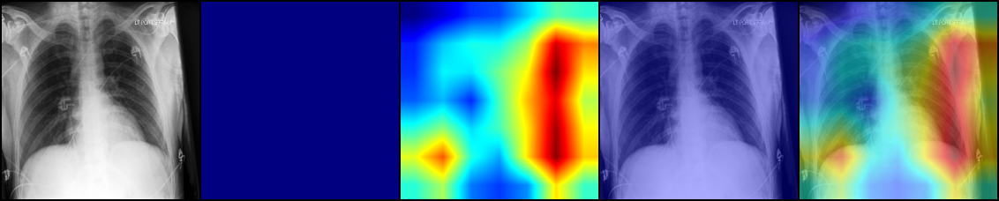

In [ ]:
# Non Covid image for class idx 0
transforms.ToPILImage()(grid_image)

In [ ]:
images = []
for gradcam, gradcam_pp in cams:
    mask, logit = gradcam(non_covid_normed_torch_img, class_idx=1)
    heatmap, result = visualize_cam(mask, non_covid_torch_img)

    mask_pp, logit2 = gradcam_pp(non_covid_normed_torch_img, class_idx=1)
    heatmap_pp, result_pp = visualize_cam(mask_pp, non_covid_torch_img)
    
    images.extend([non_covid_torch_img.cpu(), heatmap, heatmap_pp, result, result_pp])
    
grid_image = make_grid(images, nrow=5)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning:

nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.



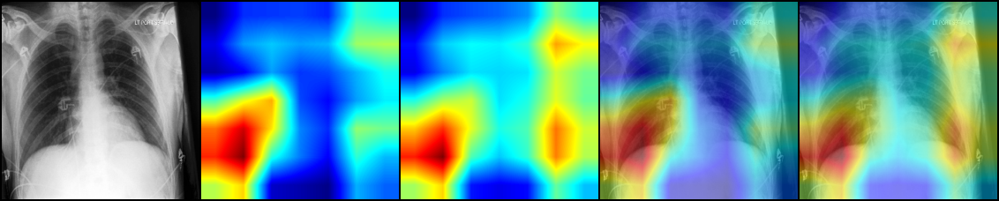

In [ ]:
# Non Covid image for class idx 1
transforms.ToPILImage()(grid_image)

DenseNet-201

In [ ]:
model_densenet201.eval()

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(covid_img_path)
model_output= model_densenet201(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[9.9990e-01, 1.0007e-04]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.99989986

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(non_covid_img_path)
model_output= model_densenet201(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[0.0063, 0.9937]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.006266558

In [ ]:
configs = [
    dict(model_type='densenet', arch=model_densenet201, layer_name='features_norm5')
]

In [ ]:
for config in configs:
    config['arch'].to(device).eval()

cams = [
    [cls.from_config(**config) for cls in (GradCAM, GradCAMpp)]
    for config in configs
]

In [ ]:
images = []
for gradcam, gradcam_pp in cams:
    mask, logit = gradcam(covid_normed_torch_img, class_idx=0)
    heatmap, result = visualize_cam(mask, covid_torch_img)

    mask_pp, logit2 = gradcam_pp(covid_normed_torch_img, class_idx=0)
    heatmap_pp, result_pp = visualize_cam(mask_pp, covid_torch_img)
    
    images.extend([covid_torch_img.cpu(), heatmap, heatmap_pp, result, result_pp])
    
grid_image = make_grid(images, nrow=5)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning:

nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.



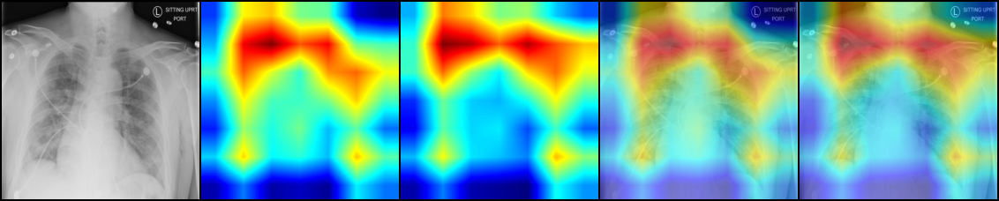

In [ ]:
# Covid image for class idx 0
transforms.ToPILImage()(grid_image)

In [ ]:
images = []
for gradcam, gradcam_pp in cams:
    mask, logit = gradcam(covid_normed_torch_img, class_idx=1)
    heatmap, result = visualize_cam(mask, covid_torch_img)

    mask_pp, logit2 = gradcam_pp(covid_normed_torch_img, class_idx=1)
    heatmap_pp, result_pp = visualize_cam(mask_pp, covid_torch_img)
    
    images.extend([covid_torch_img.cpu(), heatmap, heatmap_pp, result, result_pp])
    
grid_image = make_grid(images, nrow=5)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning:

nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.



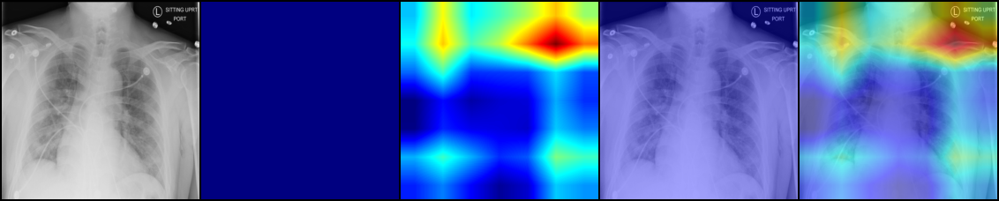

In [ ]:
# Covid image for class idx 1
transforms.ToPILImage()(grid_image)

In [ ]:
images = []
for gradcam, gradcam_pp in cams:
    mask, logit = gradcam(non_covid_normed_torch_img, class_idx=0)
    heatmap, result = visualize_cam(mask, non_covid_torch_img)

    mask_pp, logit2 = gradcam_pp(non_covid_normed_torch_img, class_idx=0)
    heatmap_pp, result_pp = visualize_cam(mask_pp, non_covid_torch_img)
    
    images.extend([non_covid_torch_img.cpu(), heatmap, heatmap_pp, result, result_pp])
    
grid_image = make_grid(images, nrow=5)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning:

nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.



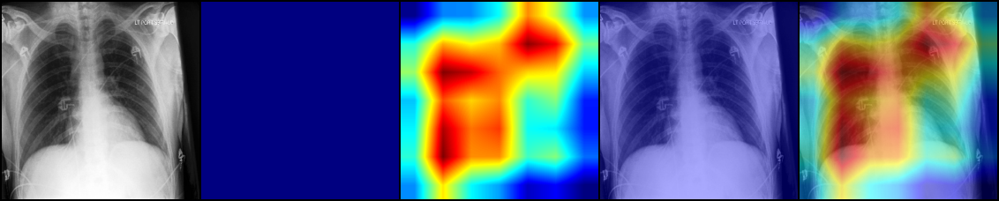

In [ ]:
# Non Covid image for class idx 0
transforms.ToPILImage()(grid_image)

In [ ]:
images = []
for gradcam, gradcam_pp in cams:
    mask, logit = gradcam(non_covid_normed_torch_img, class_idx=1)
    heatmap, result = visualize_cam(mask, non_covid_torch_img)

    mask_pp, logit2 = gradcam_pp(non_covid_normed_torch_img, class_idx=1)
    heatmap_pp, result_pp = visualize_cam(mask_pp, non_covid_torch_img)
    
    images.extend([non_covid_torch_img.cpu(), heatmap, heatmap_pp, result, result_pp])
    
grid_image = make_grid(images, nrow=5)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning:

nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.



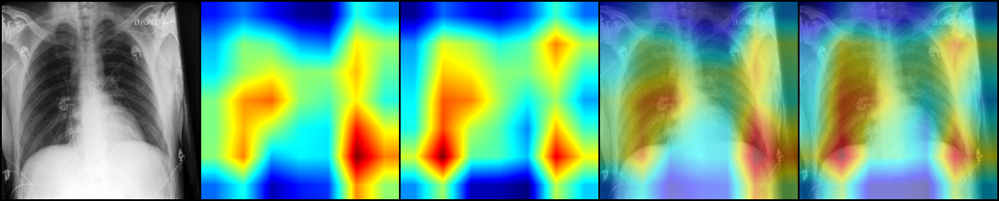

In [ ]:
# Non Covid image for class idx 1
transforms.ToPILImage()(grid_image)

COVID-19 random Image-1 from Test Set

In [ ]:
covid_img_path = '/content/drive/MyDrive/val/covid/16654_2_1.jpg'

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(covid_img_path)
model_output= model_resnet18(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[9.9984e-01, 1.6194e-04]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.999838

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(covid_img_path)
model_output= model_resnet50(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[9.9999e-01, 8.3052e-06]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.99999166

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(covid_img_path)
model_output= model_densenet121(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[9.9971e-01, 2.8539e-04]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.99971455

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(covid_img_path)
model_output= model_densenet201(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[9.9990e-01, 1.0007e-04]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.99989986

In [ ]:
covid_pil_img = PIL.Image.open(covid_img_path).convert('RGB')

In [ ]:
covid_torch_img = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])(covid_pil_img).to(device)

non_covid_torch_img = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])(non_covid_pil_img).to(device)


In [ ]:
covid_normed_torch_img = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(covid_torch_img)[None]

In [ ]:
configs = [
    dict(model_type='resnet', arch=model_resnet18, layer_name='layer4'),
    dict(model_type='resnet', arch=model_resnet50, layer_name='layer4'),
    dict(model_type='densenet', arch=model_densenet121, layer_name='features_norm5'),
    dict(model_type='densenet', arch=model_densenet201, layer_name='features_norm5')
]

In [ ]:
for config in configs:
    config['arch'].to(device).eval()

cams = [
    [cls.from_config(**config) for cls in (GradCAM, GradCAMpp)]
    for config in configs
]

In [ ]:
images = []
for gradcam, gradcam_pp in cams:
    mask, logit = gradcam(covid_normed_torch_img, class_idx=0)
    heatmap, result = visualize_cam(mask, covid_torch_img)

    mask_pp, logit2 = gradcam_pp(covid_normed_torch_img, class_idx=0)
    heatmap_pp, result_pp = visualize_cam(mask_pp, covid_torch_img)
    
    images.extend([covid_torch_img.cpu(), heatmap, result])
    
grid_image = make_grid(images, nrow=3)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning:

nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.



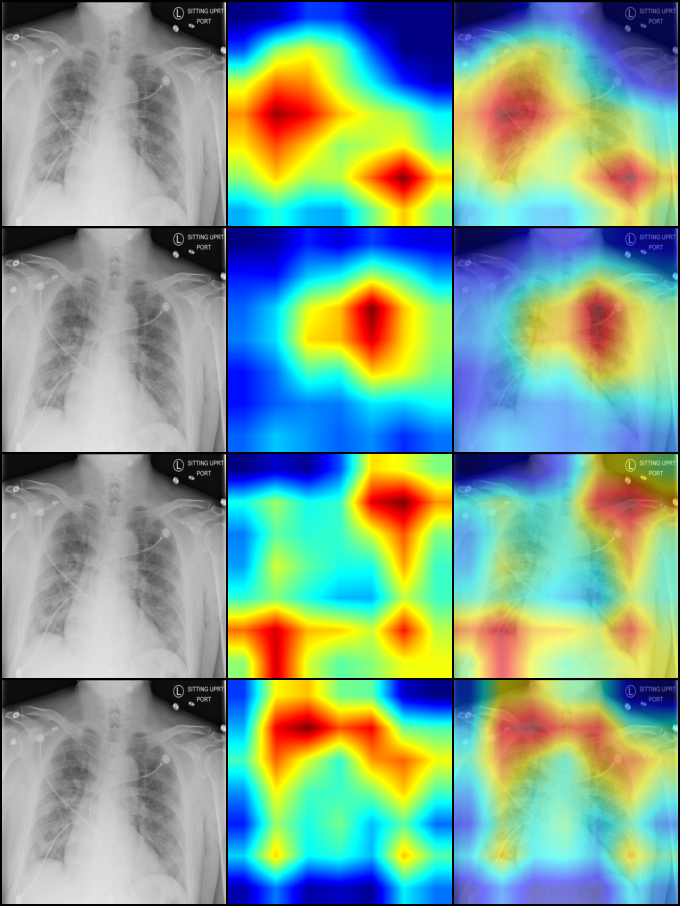

In [ ]:
# Covid image for class idx 0
transforms.ToPILImage()(grid_image)

COVID-19 random Image-2 from Test Set

In [ ]:
covid_img_path = '/content/drive/MyDrive/val/covid/41591_2020_819_Fig1_HTML.webp-day10.png'

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(covid_img_path)
model_output= model_resnet18(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[0.8928, 0.1072]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.8928005

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(covid_img_path)
model_output= model_resnet50(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[0.9663, 0.0337]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.96633005

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(covid_img_path)
model_output= model_densenet121(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[0.9920, 0.0080]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.9919905

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(covid_img_path)
model_output= model_densenet201(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[0.8930, 0.1070]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.89301276

In [ ]:
covid_pil_img = PIL.Image.open(covid_img_path).convert('RGB')

In [ ]:
covid_torch_img = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])(covid_pil_img).to(device)

non_covid_torch_img = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])(non_covid_pil_img).to(device)


In [ ]:
covid_normed_torch_img = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(covid_torch_img)[None]

In [ ]:
configs = [
    dict(model_type='resnet', arch=model_resnet18, layer_name='layer4'),
    dict(model_type='resnet', arch=model_resnet50, layer_name='layer4'),
    dict(model_type='densenet', arch=model_densenet121, layer_name='features_norm5'),
    dict(model_type='densenet', arch=model_densenet201, layer_name='features_norm5')
]

In [ ]:
for config in configs:
    config['arch'].to(device).eval()

cams = [
    [cls.from_config(**config) for cls in (GradCAM, GradCAMpp)]
    for config in configs
]

In [ ]:
images = []
for gradcam, gradcam_pp in cams:
    mask, logit = gradcam(covid_normed_torch_img, class_idx=0)
    heatmap, result = visualize_cam(mask, covid_torch_img)

    mask_pp, logit2 = gradcam_pp(covid_normed_torch_img, class_idx=0)
    heatmap_pp, result_pp = visualize_cam(mask_pp, covid_torch_img)
    
    images.extend([covid_torch_img.cpu(), heatmap, result])
    
grid_image = make_grid(images, nrow=3)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning:

nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.



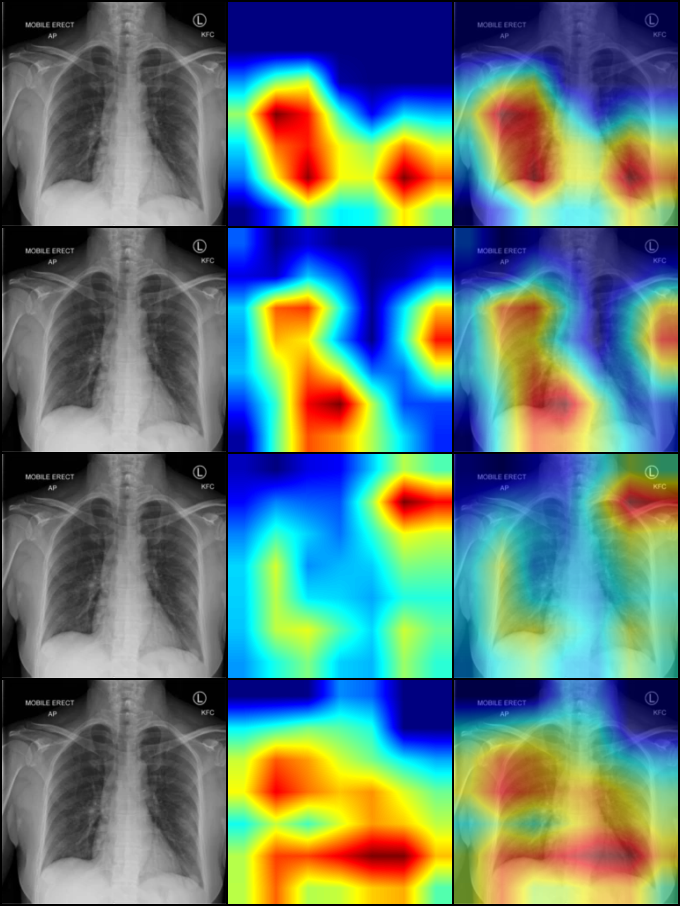

In [ ]:
# Covid image for class idx 0
transforms.ToPILImage()(grid_image)

COVID-19 random Image-3 from Test Set

In [ ]:
covid_img_path = '/content/drive/MyDrive/val/covid/covid-19-infection-exclusive-gastrointestinal-symptoms-pa.png'

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(covid_img_path)
model_output= model_resnet18(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[1.0000e+00, 4.5859e-06]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.99999547

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(covid_img_path)
model_output= model_resnet50(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[9.9921e-01, 7.9237e-04]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.9992077

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(covid_img_path)
model_output= model_densenet121(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[0.9973, 0.0027]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.9973252

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(covid_img_path)
model_output= model_densenet201(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[0.9971, 0.0029]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.9970515

In [ ]:
covid_pil_img = PIL.Image.open(covid_img_path).convert('RGB')

In [ ]:
covid_torch_img = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])(covid_pil_img).to(device)

non_covid_torch_img = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])(non_covid_pil_img).to(device)


In [ ]:
covid_normed_torch_img = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(covid_torch_img)[None]

In [ ]:
configs = [
    dict(model_type='resnet', arch=model_resnet18, layer_name='layer4'),
    dict(model_type='resnet', arch=model_resnet50, layer_name='layer4'),
    dict(model_type='densenet', arch=model_densenet121, layer_name='features_norm5'),
    dict(model_type='densenet', arch=model_densenet201, layer_name='features_norm5')
]

In [ ]:
for config in configs:
    config['arch'].to(device).eval()

cams = [
    [cls.from_config(**config) for cls in (GradCAM, GradCAMpp)]
    for config in configs
]

In [ ]:
images = []
for gradcam, gradcam_pp in cams:
    mask, logit = gradcam(covid_normed_torch_img, class_idx=0)
    heatmap, result = visualize_cam(mask, covid_torch_img)

    mask_pp, logit2 = gradcam_pp(covid_normed_torch_img, class_idx=0)
    heatmap_pp, result_pp = visualize_cam(mask_pp, covid_torch_img)
    
    images.extend([covid_torch_img.cpu(), heatmap, result])
    
grid_image = make_grid(images, nrow=3)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning:

nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.



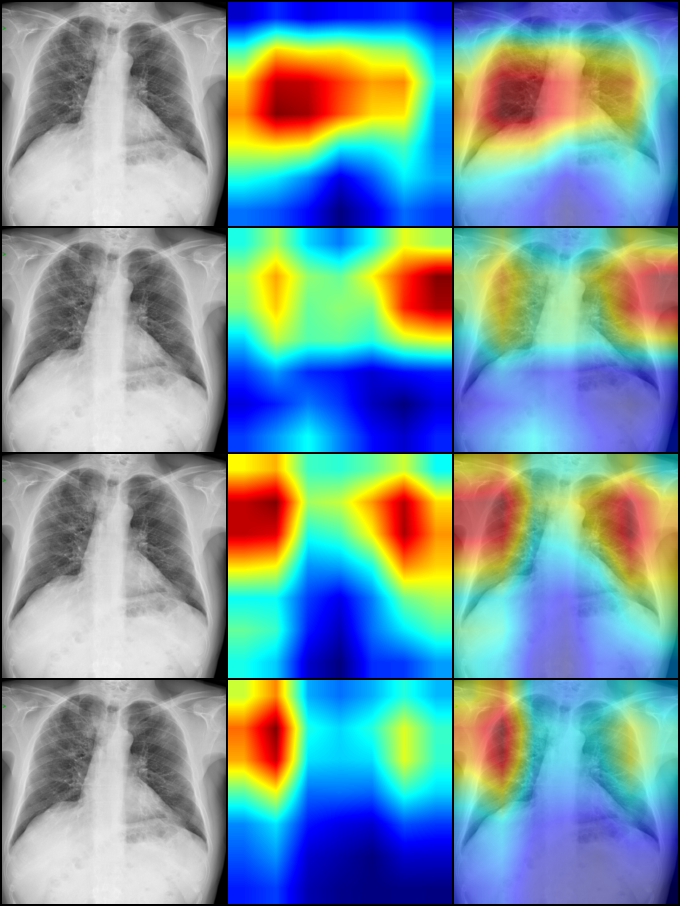

In [ ]:
# Covid image for class idx 0
transforms.ToPILImage()(grid_image)

In [ ]:
# covid_img_path = '/content/drive/MyDrive/val/covid/covid-19-pneumonia-14-PA.png'
covid_img_path = '/content/drive/MyDrive/val/covid/AR-1.jpg'

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(covid_img_path)
model_output= model_resnet18(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[9.9986e-01, 1.3622e-04]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.99986374

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(covid_img_path)
model_output= model_resnet50(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[0.9807, 0.0193]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.98072696

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(covid_img_path)
model_output= model_densenet121(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]
print("%03d Covid predicted label:%s" %(52, class_names[int(cur_pred.data.numpy())]) )

tensor([[0.9962, 0.0038]], grad_fn=<CopyBackwards>)
052 Covid predicted label:covid


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(covid_img_path)
model_output= model_densenet201(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[0.9851, 0.0149]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



0.9850758

In [ ]:
covid_pil_img = PIL.Image.open(covid_img_path).convert('RGB')

In [ ]:
covid_torch_img = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])(covid_pil_img).to(device)

In [ ]:
covid_normed_torch_img = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(covid_torch_img)[None]

In [ ]:
configs = [
    dict(model_type='resnet', arch=model_resnet18, layer_name='layer4'),
    dict(model_type='resnet', arch=model_resnet50, layer_name='layer4'),
    dict(model_type='densenet', arch=model_densenet121, layer_name='features_norm5'),
    dict(model_type='densenet', arch=model_densenet201, layer_name='features_norm5')
]

In [ ]:
for config in configs:
    config['arch'].to(device).eval()

cams = [
    [cls.from_config(**config) for cls in (GradCAM, GradCAMpp)]
    for config in configs
]

In [ ]:
images = []
for gradcam, gradcam_pp in cams:
    mask, logit = gradcam(covid_normed_torch_img, class_idx=0)
    heatmap, result = visualize_cam(mask, covid_torch_img)

    mask_pp, logit2 = gradcam_pp(covid_normed_torch_img, class_idx=0)
    heatmap_pp, result_pp = visualize_cam(mask_pp, covid_torch_img)
    
    images.extend([covid_torch_img.cpu(), heatmap, result])
    
grid_image = make_grid(images, nrow=3)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning:

nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.



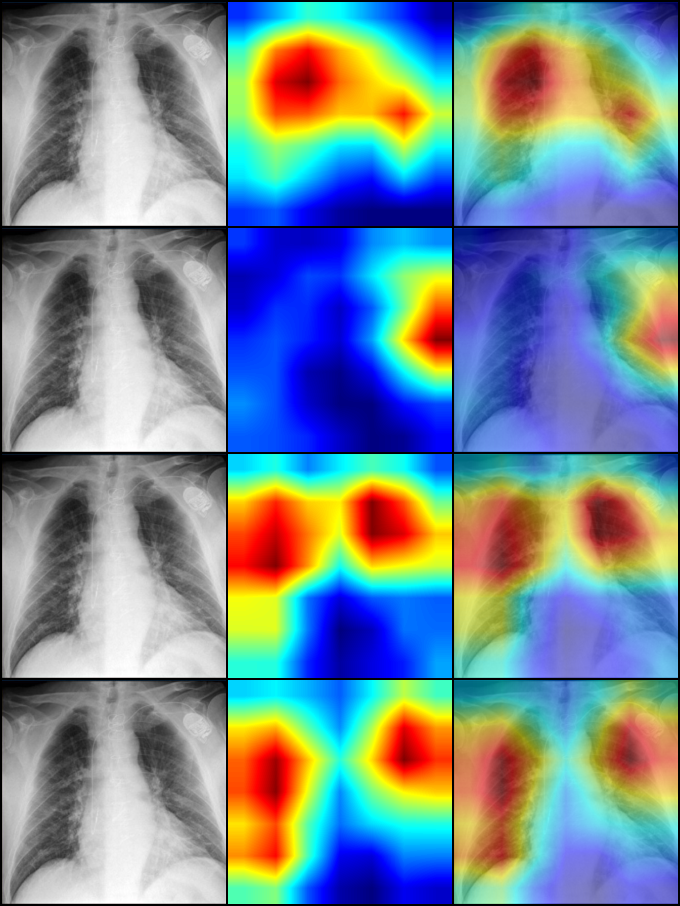

In [ ]:
# Covid image for class idx 0
transforms.ToPILImage()(grid_image)

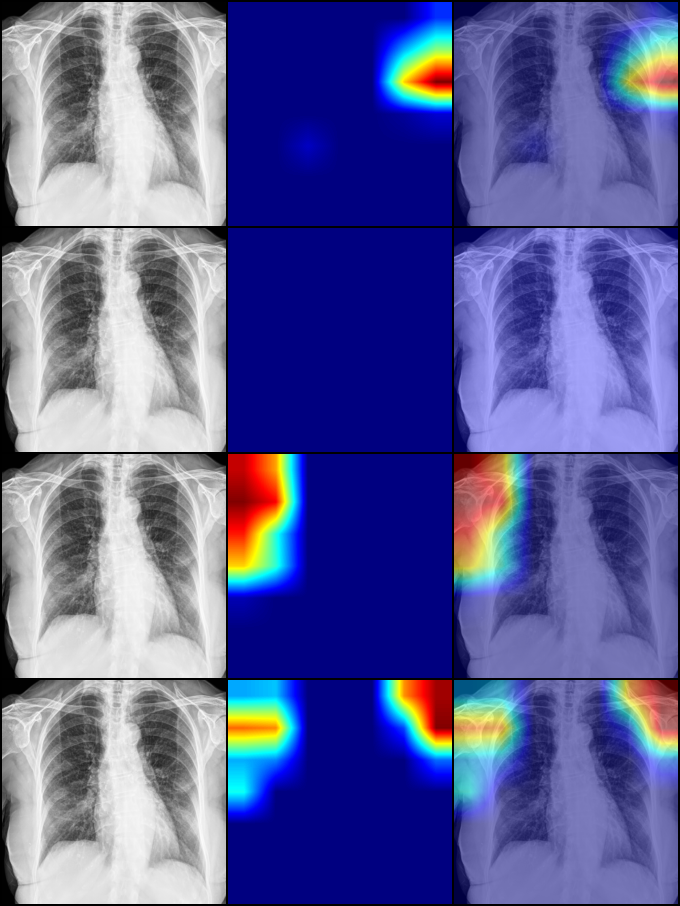

In [ ]:
# Covid image for class idx 0
transforms.ToPILImage()(grid_image)

For Non_COVID Images

In [ ]:
non_covid_img_path = '/content/drive/MyDrive/val/non/patient00004-study1-view1_frontal.jpg'

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(non_covid_img_path)
model_output= model_resnet18(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[6.5216e-06, 9.9999e-01]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



6.521552e-06

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(non_covid_img_path)
model_output= model_resnet50(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[2.0449e-06, 1.0000e+00]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



2.044888e-06

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(non_covid_img_path)
model_output= model_densenet121(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[3.1496e-06, 1.0000e+00]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



3.149552e-06

In [ ]:
# Print probabilities for covid and non-covid
cur_img = image_loader(non_covid_img_path)
model_output= model_densenet201(cur_img)
cur_pred = model_output.max(1, keepdim=True)[1].cpu()
cur_prob = sm(model_output).cpu()
print(cur_prob)
cur_prob.data.numpy()[0,0]

tensor([[1.1570e-05, 9.9999e-01]], grad_fn=<CopyBackwards>)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



1.1569612e-05

In [ ]:
non_covid_pil_img = PIL.Image.open(non_covid_img_path).convert('RGB')

In [ ]:

non_covid_torch_img = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])(non_covid_pil_img).to(device)

In [ ]:
non_covid_normed_torch_img = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(non_covid_torch_img)[None]

In [ ]:
configs = [
    dict(model_type='resnet', arch=model_resnet18, layer_name='layer4'),
    dict(model_type='resnet', arch=model_resnet50, layer_name='layer4'),
    dict(model_type='densenet', arch=model_densenet121, layer_name='features_norm5'),
    dict(model_type='densenet', arch=model_densenet201, layer_name='features_norm5')
]

In [ ]:
for config in configs:
    config['arch'].to(device).eval()

cams = [
    [cls.from_config(**config) for cls in (GradCAM, GradCAMpp)]
    for config in configs
]

In [ ]:
images = []
for gradcam, gradcam_pp in cams:
    mask, logit = gradcam(non_covid_normed_torch_img, class_idx=0)
    heatmap, result = visualize_cam(mask, non_covid_torch_img)

    mask_pp, logit2 = gradcam_pp(non_covid_normed_torch_img, class_idx=0)
    heatmap_pp, result_pp = visualize_cam(mask_pp, non_covid_torch_img)
    
    images.extend([non_covid_torch_img.cpu(), heatmap, result])
    
grid_image = make_grid(images, nrow=3)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning:

nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.



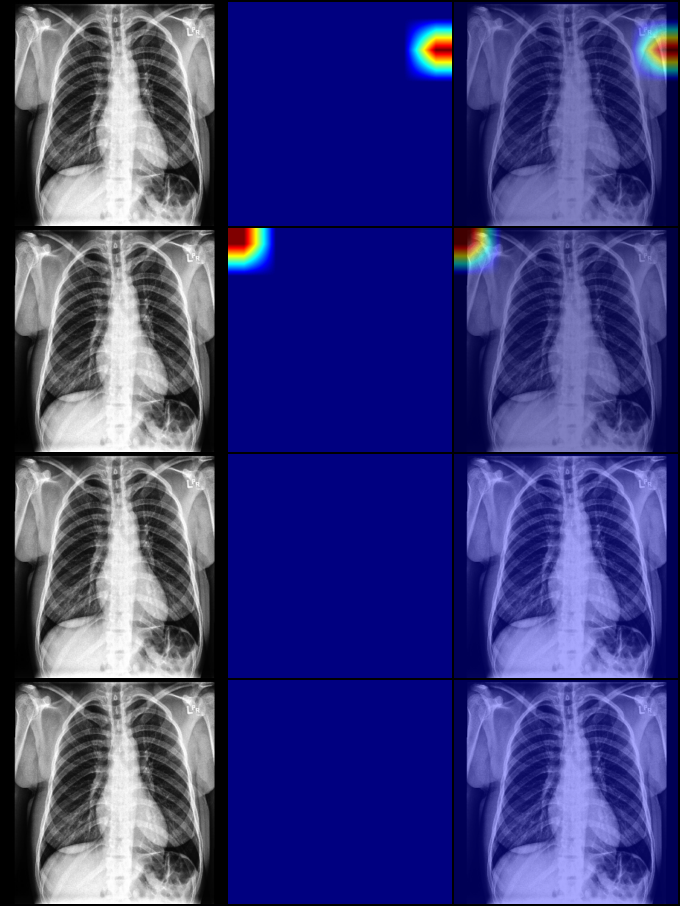

In [ ]:
# Covid image for class idx 0
transforms.ToPILImage()(grid_image)

Model Summary

In [ ]:
from prettytable import PrettyTable

def count_parameters(model):
    table = PrettyTable(["Modules", "Parameters"])
    total_params = 0
    for name, parameter in model.named_parameters():
        if not parameter.requires_grad: continue
        param = parameter.numel()
        table.add_row([name, param])
        total_params+=param
    print(table)
    print(f"Total Trainable Params: {total_params}")
    return total_params


In [ ]:
count_parameters(model_resnet18)

+------------------------------+------------+
|           Modules            | Parameters |
+------------------------------+------------+
|         conv1.weight         |    9408    |
|          bn1.weight          |     64     |
|           bn1.bias           |     64     |
|    layer1.0.conv1.weight     |   36864    |
|     layer1.0.bn1.weight      |     64     |
|      layer1.0.bn1.bias       |     64     |
|    layer1.0.conv2.weight     |   36864    |
|     layer1.0.bn2.weight      |     64     |
|      layer1.0.bn2.bias       |     64     |
|    layer1.1.conv1.weight     |   36864    |
|     layer1.1.bn1.weight      |     64     |
|      layer1.1.bn1.bias       |     64     |
|    layer1.1.conv2.weight     |   36864    |
|     layer1.1.bn2.weight      |     64     |
|      layer1.1.bn2.bias       |     64     |
|    layer2.0.conv1.weight     |   73728    |
|     layer2.0.bn1.weight      |    128     |
|      layer2.0.bn1.bias       |    128     |
|    layer2.0.conv2.weight     |  

11177538

In [ ]:
count_parameters(model_resnet50)

+------------------------------+------------+
|           Modules            | Parameters |
+------------------------------+------------+
|         conv1.weight         |    9408    |
|          bn1.weight          |     64     |
|           bn1.bias           |     64     |
|    layer1.0.conv1.weight     |    4096    |
|     layer1.0.bn1.weight      |     64     |
|      layer1.0.bn1.bias       |     64     |
|    layer1.0.conv2.weight     |   36864    |
|     layer1.0.bn2.weight      |     64     |
|      layer1.0.bn2.bias       |     64     |
|    layer1.0.conv3.weight     |   16384    |
|     layer1.0.bn3.weight      |    256     |
|      layer1.0.bn3.bias       |    256     |
| layer1.0.downsample.0.weight |   16384    |
| layer1.0.downsample.1.weight |    256     |
|  layer1.0.downsample.1.bias  |    256     |
|    layer1.1.conv1.weight     |   16384    |
|     layer1.1.bn1.weight      |     64     |
|      layer1.1.bn1.bias       |     64     |
|    layer1.1.conv2.weight     |  

23512130

In [ ]:
count_parameters(model_densenet121)

+------------------------------------------------+------------+
|                    Modules                     | Parameters |
+------------------------------------------------+------------+
|             features.conv0.weight              |    9408    |
|             features.norm0.weight              |     64     |
|              features.norm0.bias               |     64     |
| features.denseblock1.denselayer1.norm1.weight  |     64     |
|  features.denseblock1.denselayer1.norm1.bias   |     64     |
| features.denseblock1.denselayer1.conv1.weight  |    8192    |
| features.denseblock1.denselayer1.norm2.weight  |    128     |
|  features.denseblock1.denselayer1.norm2.bias   |    128     |
| features.denseblock1.denselayer1.conv2.weight  |   36864    |
| features.denseblock1.denselayer2.norm1.weight  |     96     |
|  features.denseblock1.denselayer2.norm1.bias   |     96     |
| features.denseblock1.denselayer2.conv1.weight  |   12288    |
| features.denseblock1.denselayer2.norm2

6955906

In [ ]:
count_parameters(model_densenet201)

+------------------------------------------------+------------+
|                    Modules                     | Parameters |
+------------------------------------------------+------------+
|             features.conv0.weight              |    9408    |
|             features.norm0.weight              |     64     |
|              features.norm0.bias               |     64     |
| features.denseblock1.denselayer1.norm1.weight  |     64     |
|  features.denseblock1.denselayer1.norm1.bias   |     64     |
| features.denseblock1.denselayer1.conv1.weight  |    8192    |
| features.denseblock1.denselayer1.norm2.weight  |    128     |
|  features.denseblock1.denselayer1.norm2.bias   |    128     |
| features.denseblock1.denselayer1.conv2.weight  |   36864    |
| features.denseblock1.denselayer2.norm1.weight  |     96     |
|  features.denseblock1.denselayer2.norm1.bias   |     96     |
| features.denseblock1.denselayer2.conv1.weight  |   12288    |
| features.denseblock1.denselayer2.norm2

18096770

In [ ]:
from torchvision import models
from torchsummary import summary


summary(model_resnet18, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

In [ ]:
summary(model_resnet50, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,